# <b>Определение физиологического возраста человека
по параметрам, характеризующим состояние его здоровья.</b>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Использованы данные: https://www.kaggle.com/datasets/kukuroo3/body-performance-data

Это данные, собранные Корейским фондом содействия развитию спорта. Они состоят из результатов различных измерений физической подготовленности, которые подтверждают степень физического состояния по возрасту и  эффективности выполнения упражнений.

<b>Цель исследования:</b> построить модель, позволяющую на основании измеряемых параметров здоровья человека определять его физиологический возраст с максимально возможной точностью.

<b>Этапы исследования:</b>
1. Загрузка и изучение данных.
2. Исследовательский (разведочный) анализ и подготовка данных.
3. Подготовка данных к машинному обучению.
4. Построение моделей машинного обучения.
5. Применение фреймворков AutoML.
6. Выбор лучшей модели и выводы.

### <b>Импорт необходимых библиотек</b>

In [ ]:
pip install pandas-profiling

In [ ]:
pip install phik

In [ ]:
pip install catboost

In [ ]:
pip install witwidget --quiet

In [ ]:
pip install -q dtreeviz

In [ ]:
pip install pycaret

In [ ]:
# Импорт необходимых библиотек
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
#import missingno as msno
#import altair as alt
import pandas_profiling

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

import phik
from phik.report import plot_correlation_matrix
from phik import report

from sklearn.feature_selection import RFECV

from pycaret.regression import *

import collections
import witwidget
from witwidget.notebook.visualization import WitWidget, WitConfigBuilder

import dtreeviz
from dtreeviz.trees import *
#from IPython.display import Image, display_svg, SVG

import warnings
warnings.filterwarnings('ignore')

<ipython-input-8-1f6bbab3f42c>:9: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


### <b>Загрузка данных</b>

In [ ]:
# Загрузка данных из файла в датафрейм.
try:
    data = pd.read_csv('C:/users/Обучение/Documents/FinUniver/bodyPerformance.csv')
except:
    from google.colab import drive
    drive.mount('/content/drive')
    data = pd.read_csv('/content/drive/MyDrive/Finance University/Modul 2/bodyPerformance.csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Вывод первых пяти строк датафрейма.
data.head()

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,M,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C
1,25.0,M,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
2,31.0,M,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C
3,32.0,M,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B
4,28.0,M,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B


Показатели состояния человека
- age - физиологический возраст (целевой признак)
- gender - пол
- height_cm - рост в сантиметрах
- weight_kg - вес в килограммах
- body fat_% - степень ожирения в процентах
- diastolic - диастолическое (нижнее) артериальное давление
- systolic - систолическое (верхнее) артериальное давление
- gripForce -  сила жима кисти в килограммах
- sit and bend forward_cm - глубина наклона вперед в положении сидя в сантиметрах
- sit-ups counts - количество приседаний за две минуты
- broad jump_cm - длина прыжка с места в сантиметрах
- class - экспертная оценка уровня здоровья (A, B, C, D, где A - самое лучшее здоровье)

### <b>EDA (разведочный анализ) и подготовка данных</b>

#### <b>Выявление основных структур</b>

In [ ]:
# Вывод  общей информации о датасете.
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13393 entries, 0 to 13392
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      13393 non-null  float64
 1   gender                   13393 non-null  object 
 2   height_cm                13393 non-null  float64
 3   weight_kg                13393 non-null  float64
 4   body fat_%               13393 non-null  float64
 5   diastolic                13393 non-null  float64
 6   systolic                 13393 non-null  float64
 7   gripForce                13393 non-null  float64
 8   sit and bend forward_cm  13393 non-null  float64
 9   sit-ups counts           13393 non-null  float64
 10  broad jump_cm            13393 non-null  float64
 11  class                    13393 non-null  object 
dtypes: float64(10), object(2)
memory usage: 1.2+ MB


In [ ]:
# Вывод основной статистической информации о датасете.
data.describe()

,age,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm
count,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000
mean,36.775106,168.559807,67.447316,23.240165,78.796842,130.234817,36.963877,15.209268,39.771224,190.129627
std,13.625639,8.426583,11.949666,7.256844,10.742033,14.713954,10.624864,8.456677,14.276698,39.868000
min,21.000000,125.000000,26.300000,3.000000,0.000000,0.000000,0.000000,-25.000000,0.000000,0.000000
25%,25.000000,162.400000,58.200000,18.000000,71.000000,120.000000,27.500000,10.900000,30.000000,162.000000
50%,32.000000,169.200000,67.400000,22.800000,79.000000,130.000000,37.900000,16.200000,41.000000,193.000000
75%,48.000000,174.800000,75.300000,28.000000,86.000000,141.000000,45.200000,20.700000,50.000000,221.000000
max,64.000000,193.800000,138.100000,78.400000,156.200000,201.000000,70.500000,213.000000,80.000000,303.000000


In [ ]:
# Пропусков в данных нет, но проверю это еще раз с помощью метода .isna().
data.isna().sum()

age                        0
gender                     0
height_cm                  0
weight_kg                  0
body fat_%                 0
diastolic                  0
systolic                   0
gripForce                  0
sit and bend forward_cm    0
sit-ups counts             0
broad jump_cm              0
class                      0
dtype: int64

In [ ]:
# Проверка датасета на наличие явных дубликатов.
data.duplicated().sum()

1

In [ ]:
# Обнаружена одна строка дубликат. Удалю ее.
data= data.drop_duplicates ()

In [ ]:
# Необходимо убедиться, что дубликатов не осталось.
data.duplicated().sum()

0

Дубликатов в датасете не осталось.

In [ ]:
# Повторный вывод общей информации о датасете.
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13392 entries, 0 to 13392
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      13392 non-null  float64
 1   gender                   13392 non-null  object 
 2   height_cm                13392 non-null  float64
 3   weight_kg                13392 non-null  float64
 4   body fat_%               13392 non-null  float64
 5   diastolic                13392 non-null  float64
 6   systolic                 13392 non-null  float64
 7   gripForce                13392 non-null  float64
 8   sit and bend forward_cm  13392 non-null  float64
 9   sit-ups counts           13392 non-null  float64
 10  broad jump_cm            13392 non-null  float64
 11  class                    13392 non-null  object 
dtypes: float64(10), object(2)
memory usage: 1.3+ MB


В датасете 12 столбцов и 13392 строки. Пропусков в данных нет. Большая часть столбцов имеет тип данных float, столбцы gender и class имеют тип object.

В столбцах age, diastolic, systolic, sit-ups counts и broad jump_cm содержатся целочисленные данные. Небходимо привести эти столбцы  к типу данных int.

Названия столбцов трудно использовать из-за беспорядочного использования строчных букв, нижних подчеркиваний, дефисов и пробелов. Необходимо привести названия столбцов к единому стандарту.

In [ ]:
# Изменю тип столбцов 'age', 'diastolic', 'systolic', 'sit-ups counts', 'broad jump_cm' на int.
data[['age', 'diastolic', 'systolic', 'sit-ups counts', 'broad jump_cm']] = data[[
    'age', 'diastolic', 'systolic', 'sit-ups counts', 'broad jump_cm']].astype('int')

In [ ]:
# Изменю названия столбцов.
data = data.rename(columns={'height_cm':'height', 'weight_kg':'weight', 'body fat_%':'body_fat', 'gripForce':'grip_forse',
                                    'sit and bend forward_cm':'sit_and_bend', 'sit-ups counts':'sit_ups', 'broad jump_cm':'broad_jump'})
data.columns

Index(['age', 'gender', 'height', 'weight', 'body_fat', 'diastolic',
       'systolic', 'grip_forse', 'sit_and_bend', 'sit_ups', 'broad_jump',
       'class'],
      dtype='object')

Названия столбцов унифицированы. Типы данных в столбцах приведены в соответствие с содержанием.

#### <b>Создание дополнительных признаков</b>

Проанализирую возможность влияния признаков на уровень здоровья.
- В исследовании принимали участие взрослые люди с завершившимся процессом роста, поэтому рост и вес сами по себе не могут определять филиологический возраст. Правильнее использовать индекс массы тела (body mass index (BMI)), который позволяет оценить соответствие роста весу. Body mass index рассчитывается так:

 $BMI = \dfrac{weight}{height^2}$.

Вес принимается в килограммах, а рост в метрах. Создам дополнительный признак bmi.
- Длина прыжка с места объективно зависит от роста. Чем выше человек, тем легче ему дальше прыгнуть. Чтобы правильно использовать длину прыжка в качестве параметра для определения физиологического возраста, поделю длину прыжка на рост, тем самым исключу преимущество высоких людей.
- Глубина наклона вперед в положении сидя также объективно зависит от роста.По аналогии с длиной прыжка создам признак нормированной глубины наклона, поделив ее на рост.
- Рост, вес, длину прыжка и глубину наклона удалю.
- При анализе влияния на степень здоровья систолического и диастолического артериального давления важно учитывать не только их абсолютные значения, но и разницу между ними. Разница между верхним и нижним давлением называется пульсовым давлением (pulse pressure). Допустимой принято считать разницу между верхним и нижним давлением 35-50 мм. Создам дополнительный столбец pulse_pressure с разницей между систолическим и диастолическим давлениями.

In [ ]:
# Создаю столбец с индексом массы тела.
data['bmi'] = (data['weight'] / (data['height'] * data['height'])) * 10000

In [ ]:
# Нормирую длину прыжка, поделив ее на рост.
data['broad_jump_per_height'] = data['broad_jump'] / data['height']

In [ ]:
# Нормирую глубину наклона, поделив ее на рост.
data['sit_and_bend_per_height'] = data['sit_and_bend'] / data['height']

In [ ]:
# Удаляю столбцы с ростом и весом.
data = data.drop(['weight', 'height', 'broad_jump', 'sit_and_bend'], axis=1)

In [ ]:
# Создаю новый столбец с пульсовым давлением.
data['pulse_pressure'] = data['systolic'] - data['diastolic']

In [ ]:
# Посмотрю, что получилось.
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13392 entries, 0 to 13392
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      13392 non-null  int64  
 1   gender                   13392 non-null  object 
 2   body_fat                 13392 non-null  float64
 3   diastolic                13392 non-null  int64  
 4   systolic                 13392 non-null  int64  
 5   grip_forse               13392 non-null  float64
 6   sit_ups                  13392 non-null  int64  
 7   class                    13392 non-null  object 
 8   bmi                      13392 non-null  float64
 9   broad_jump_per_height    13392 non-null  float64
 10  sit_and_bend_per_height  13392 non-null  float64
 11  pulse_pressure           13392 non-null  int64  
dtypes: float64(5), int64(5), object(2)
memory usage: 1.3+ MB


#### <b>Обнаружение отклонений и аномалий.</b>

##### <b>Целевой признак возраст (age)</b>

In [ ]:
# Статистики целевого столбца age.
data['age'].describe()

count    13392.000000
mean        36.775836
std         13.625886
min         21.000000
25%         25.000000
50%         32.000000
75%         48.000000
max         64.000000
Name: age, dtype: float64

В выборке участвовали люди от 21 до 64 лет. Средний возраст составляет 36.77 лет, медианный - 32 года. Это говорит о том, что распределение по возрасту имеет скос вправо.

In [ ]:
# Построю диаграмму размаха отдельно по мужчинам и женщинам.
px.box(data, x='age', y='gender', title='Распределение людей в выборке по возрасту')

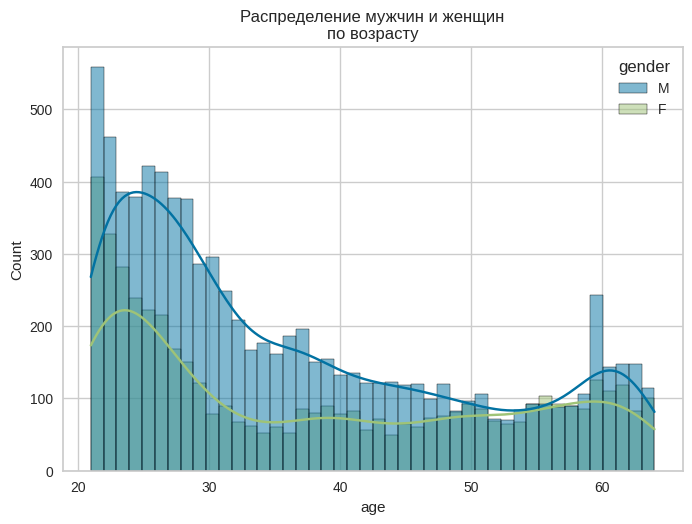

In [ ]:
# Построю гистограммы распределения по возрасту для мужчин и женщин.
plt.title('Распределение мужчин и женщин\nпо возрасту')
sns.histplot(data=data, bins=44, x='age', kde=True, hue='gender');

И мужчины и женщины представлены во всем диапазоне от 21 до 64 лет. В выборке участвовало значительно больше молодых людей и у мужчин, и у женщин. Медианный возраст у женщин (34 года) выше чем у мужчин (32 года), а распределение более равномерное. Небольшое увеличение количества участников наблюдается в области 60 лет и старше. Возможно, это связано с возрастом выхода на пенсию в 60 лет. Аномальных значений в распределении по возрату нет.

##### <b>Гендерный признак (gender)</b>

In [ ]:
# Статистики категориального признака gender.
data['gender'].describe()

count     13392
unique        2
top           M
freq       8467
Name: gender, dtype: object

В столбце gender два уникальных значения M (Male/Мужской) и F (Female/Женский). Наиболее часто встречается (8467 раз из 13392 строк) значение M.

In [ ]:
# Посмотрю количество мужчин и женщин в выборке.
df = data['gender'].value_counts()
df

M    8467
F    4925
Name: gender, dtype: int64

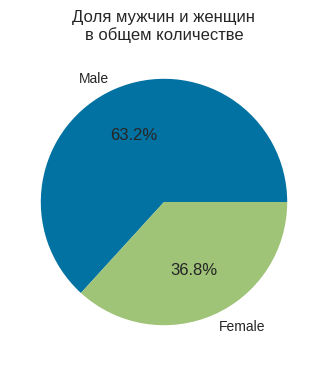

In [ ]:
# Диаграмма соотношения количества мужчин и женщин в процентах от общего количества.
plt.figure(figsize = (4,4))
plt.pie(df.values, labels=['Male', 'Female'], autopct='%1.1f%%')
plt.title('Доля мужчин и женщин\nв общем количестве');

<b>*Из 13392 человек в выборке 8467 мужчин (63.2%) и 4925 женщин (36.8%).*</b>

In [ ]:
# Преобразую тип данных столбца gender в категориальный.
data['gender'] = data['gender'].astype('category')
data['gender'].dtypes

CategoricalDtype(categories=['F', 'M'], ordered=False)

Аномальных значений в столбце gender нет. Тип данных преобразован к типу category.

##### <b>Экспертная оценка уровня здоровья (class)</b>

In [ ]:
# Статистики категориального признака class.
data['class'].describe()

count     13392
unique        4
top           C
freq       3349
Name: class, dtype: object

В столбце имеются четыре уникальных значения. Наиболее часто встречается (3349 раз из 13392 строк) значение С.

In [ ]:
# Посмотрю, как распределены данные по этим значениям.
data['class'].value_counts(sort=False)

C    3349
A    3347
B    3347
D    3349
Name: class, dtype: int64

По всем уровням здоровья данные распределены равномерно.

In [ ]:
# Заменю буквенные названия уровней здоровья цифрами учитывая порядок.
data['class'] = data['class'].replace(['A', 'B', 'C', 'D'], [1, 2, 3, 4])

In [ ]:
# Посмотрю, какой теперь тип данных у столбца class.
data['class'].dtypes

dtype('int64')

In [ ]:
# Приведу столбец class к типу category с учетом порядка.
data['class'] = data['class'].astype('category').cat.set_categories([1, 2, 3, 4], ordered=True)
data['class'].dtypes

CategoricalDtype(categories=[1, 2, 3, 4], ordered=True)

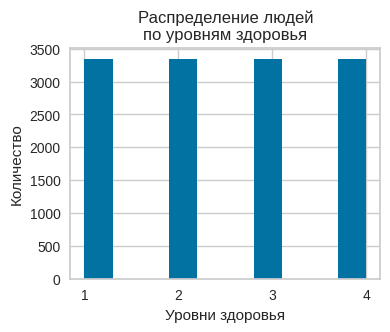

In [ ]:
# Распределение по уровням здоровья.
data['class'].hist(figsize=(4,3))
plt.title('Распределение людей\nпо уровням здоровья')
plt.xticks(data['class'].unique())
plt.xlabel('Уровни здоровья')
plt.ylabel('Количество');

Или так

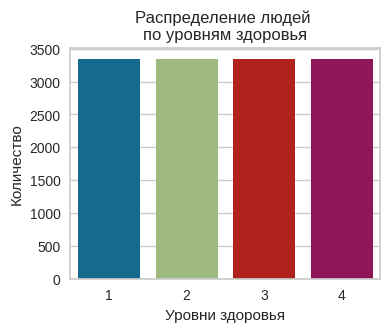

In [ ]:
plt.figure(figsize = (4,3))
sns.countplot(x=data['class'])
plt.title('Распределение людей \nпо уровням здоровья')
plt.xlabel('Уровни здоровья')
plt.ylabel('Количество');

Люди в выборке распределены по классам здоровья равномерно.

In [ ]:
# Посмотрю, как распределен возраст в зависимости от оценки уровня здоровья.
px.box(data, x= 'class', y='age', color='gender', title='Распределение физиологического возраста в зависимости от оценки уровня здоровья')

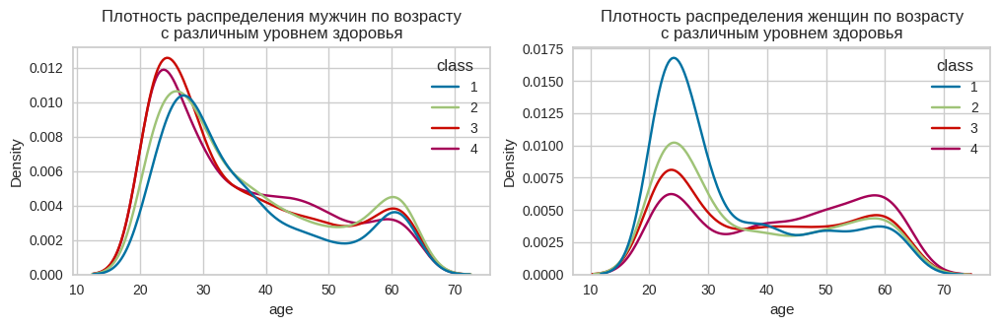

In [ ]:
# Построю плотность распределения мужчин и женщин по возрасту
plt.figure(figsize=(12, 3))

plt.subplot(1,2,1)
sns.kdeplot(data[data['gender']=='M'], x='age', hue='class')
plt.title('Плотность распределения мужчин по возрасту\nс различным уровнем здоровья')

plt.subplot(1,2,2)
sns.kdeplot(data[data['gender']=='F'], x='age', hue='class')
plt.title('Плотность распределения женщин по возрасту\nс различным уровнем здоровья')

plt.show();

- Диапазон возрастов мужчин и женщин в каждом уровне здоровья одинаков.
- Распределение мужчин по возрасту для различных уровней здоровья очень близки.
- У женщин с ухудшением уровня здоровья снижается доля молодых людей от 20 до 30 лет, а у четвертого наихудшего уровня увеличивается доля людей старше 40 лет. В связи с этим увеличиваются медианный возраст и разброс средних 50% его значений.

Признак class категориальный порядковый. Коэффициент корреляции Пирсона предполагает нормальное распределение у измеряемых численных признаков и для анализа взаимосвязи с категориальным порядковым признаком не подходит. Поэтому для признака class я буду использовать коэффициент корреляции Спирмена.

In [ ]:
# Посчитаю коэффициент корреляции Спирмена между возрастом и оценкой уровня здоровья.
data['age'].corr(data['class'], method = 'spearman').round(4)

0.051

Общий коэффициент корреляции 0.051 практически равен нулю.

In [ ]:
# Посчитаю коэффициент корреляции между возрастом и оценкой уровня здоровья у мужчин.
data.loc[data['gender']=='M', 'age'].corr(data['class'], method = 'spearman').round(4)

-0.0485

Для мужчин зависимость возраста от экспертной оценки здоровья близка к нулю (коэффициент корреляции равен -0.0485).

In [ ]:
# Посчитаю коэффициент корреляции между возрастом и оценкой уровня здоровья у женщин.
data.loc[data['gender']=='F', 'age'].corr(data['class'], method = 'spearman').round(4)

0.2038

А вот для женщин, как и ожидалось, коэффициент корреляции положительный и равен 0.2038. Это небольшая, но уже заметная положительная корреляция между оценкой уровня здоровья и возрастом.

<b>*Влияние уровня здоровья на физиологический возраст мужчин практически незаметно. У женщин при ухудшении уровня здоровья физиологический возраст увеличивается.*</b>

#####<b>Пульсовое давление (pulse_pressure)</b>

In [ ]:
# Статистики пульсового давления.
data['pulse_pressure'].describe()

count    13392.000000
mean        51.440636
std         10.863553
min        -53.000000
25%         44.000000
50%         51.000000
75%         59.000000
max        139.000000
Name: pulse_pressure, dtype: float64

In [ ]:
# Диаграмма размаха пульсового давления.
px.box(data, x='pulse_pressure', title='Распределение пульсового давления')

Среднее значение (51.44 мм рт.ст.) и медиана(51.0 мм рт.ст.) пульсового давления практически совпадают. Стандартное отклонение 10.86 мм рт.ст. Максимальное значение 139 мм рт.ст., а минимальное - отрицательное (-53 мм рт.ст.)!

В распределении пульсового давления имеется много выбросов как в области больших, так и в области маленьких значений.

Низкое пульсовое давление (меньше, чем 20-25% от систолического давления) - симптом серьезных заболеваний. Поэтому очень низкие значения пульсового давления не могут быть достоверными. А отрицательные значения являются аномалиями.

Постоянное пульсовое давление выше 50 мм может увеличить риск сердечных заболеваний, а выше 100 мм говорит о серьезных проблемах с сердечно-сосудистой системой. Пульсовое давление может повышаться при физической нагрузке. Артериальное давление должно измеряться в состоянии покоя. Возможно, при измерении давления у некоторых людей это условие было нарушено.

In [ ]:
# Посмотрю на записи с отрицательными значениями пульсового давления.
data[data['pulse_pressure']<0]

,age,gender,body_fat,diastolic,systolic,grip_forse,sit_ups,class,bmi,broad_jump_per_height,sit_and_bend_per_height,pulse_pressure
7495,30,F,28.2,156,104,21.7,43,3,21.640728,1.037132,0.174136,-52
7597,30,M,14.4,67,14,53.8,57,1,23.807842,1.326531,0.103241,-53
8217,31,M,20.8,46,43,43.9,57,2,25.724717,1.250707,0.097340,-3
12949,24,M,20.0,99,95,46.5,50,4,26.914264,1.152047,0.074854,-4


- В строке 7495 перпутаны систолическое и диастолическое давления. Это можно исправить.
- В остальных строках данные недостоверны: даже если исправить знак , то значения получатся очень низкие. Люди в возрасте от 24 до 31 лет, сумевшие присесть больше 43 раз и прыгнуть дальше 1.62 метра не могут иметь такие значения давления. Скорее всего это ошибки при измерении.

In [ ]:
# Исправлю перепутанные значения в строке 7495.
data.iloc[7495, 3] = 104
data.iloc[7495, 4] = 156
data.iloc[7495, 11] = 52
data.iloc[7495]

age                               30
gender                             F
body_fat                        28.2
diastolic                        104
systolic                         156
grip_forse                      21.7
sit_ups                           43
class                              3
bmi                        21.640728
broad_jump_per_height       1.037132
sit_and_bend_per_height     0.174136
pulse_pressure                    52
Name: 7495, dtype: object

Ошибочное значение исправлено. Посмотрю диаграммы размаха пульсового давления отдельно по мужчинам и женщинам.

In [ ]:
# Диаграмма размаха пульсового давления отдельно для мужчин и женщин.
px.box(data, x='pulse_pressure', y='gender', title='Распределение пульсового давления в выборке у мужчин и женщин')

Отрицательные значения являются ошибочными. Отклонение пульсового давления от нормы критично для организма человека и несовместимо с выполнением физических упражнений, поэтому я буду считать значения ниже 10 мм рт.ст ошибками измерения. При машинном обучении ошибочные значения, как и замена их какой либо константой будет ухудшать качество предсказания модели, поэтому ошибочные значения я удалю.

Стандартное отклонение пульсового давления для мужчин равно 11 мм рт.ст. Медиана - 53 мм рт.ст. Заменю для значений ниже 10 мм рт.ст. значения пульсового, систолического и диастолического давлений на медианные значения.

In [ ]:
data.loc[data['pulse_pressure']<10].shape

(6, 12)

С такими значениями 6 строк.

In [ ]:
data.loc[data['pulse_pressure']<10, 'systolic'] = data['systolic'].median()
data.loc[data['pulse_pressure']<10, 'diastolic'] = data['diastolic'].median()
data.loc[data['pulse_pressure']<10, 'pulse_pressure'] = data['systolic'].median() - data['diastolic'].median()

In [ ]:
# Снова построю для пульсового давления диаграммы размаха отдельно по мужчинам и женщинам.
px.box(data, x='pulse_pressure', y='gender', title='Распределение пульсового давления в выборке у мужчин и женщин')

Ошибочные значения в распределении пульсового давления исправлены. Вызывает сомнение значение пульсового давления 139 мм рт.ст., но пока я его оставлю.

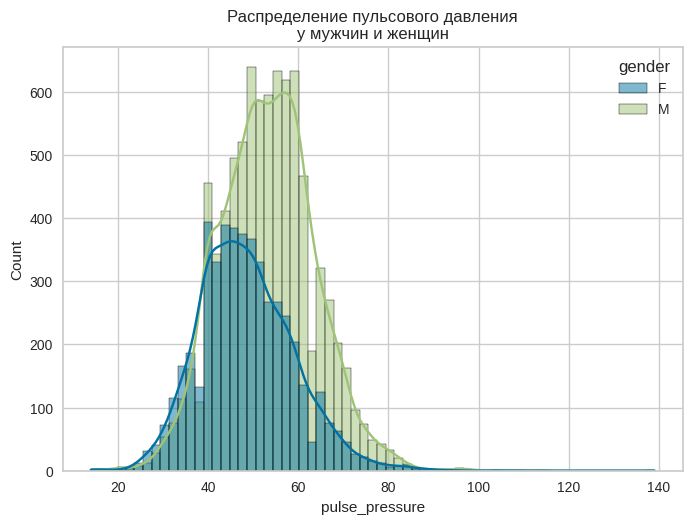

In [ ]:
# Построю гистограммы распределения пульсового давления для мужчин и женщин.
plt.title('Распределение пульсового давления\nу мужчин и женщин')
sns.histplot(data=data, bins=65, x='pulse_pressure', kde=True, hue='gender');

Почти половина женщин и больше половины мужчин, у которых пульсовое давление выше 50 мм рт.ст., находятся в группе риска по сердечно-сосудистым заболеваниям.

В распределении пульсового давления у мужчин и женщин наблюдаются всплески в области значений 40 и 50 мм рт.ст. Вероятно, это возникло из-за округлений при измерении артериального давления.

In [ ]:
# Посмотрю зависимость целевого признака от пульсового давления для мужчин и женщин с линиями трендов.
px.scatter(data, x='pulse_pressure', y='age', color='gender', trendline='ols', title='Распределение возраста в зависимости от пульсового давления у мужчин и женщин')

In [ ]:
# Коэффициент корреляции Пирсона между возрастом и пульсовым давлением.
data['age'].corr(data['pulse_pressure']).round(4)

0.1288

In [ ]:
# Коэффициент корреляции между возрастом и пульсовым давлением у мужчин.
data.loc[data['gender']=='M', 'age'].corr(data['pulse_pressure']).round(4)

0.0629

In [ ]:
# Коэффициент корреляции между возрастом и пульсовым давлением у женщин.
data.loc[data['gender']=='F', 'age'].corr(data['pulse_pressure']).round(4)

0.2756

Зависимость возраста от пульсового давления у женщин значительно выше, чем у мужчин.
- Линия тренда у мужчин почти горизонтальна ($R^2=0.004$), а коэффициент корреляции между возрастом и пульсовым давлением составляет всего 0.0629.
- У женщин наклон линии тренда гораздо выше ($R^2=0.076$), а коэффициент корреляции между возрастом и пульсовым давлением положительный и равен 0.2756.

Судя по всему, все показатели следует рассматривать отдельно для мужчин и для женщин.

##### <b>Диастолическое давление (diastolic)</b>

In [ ]:
data['diastolic'].describe()

count    13392.000000
mean        78.799208
std         10.694602
min          6.000000
25%         71.000000
50%         79.000000
75%         86.000000
max        126.000000
Name: diastolic, dtype: float64

Среднее (78.8 мм рт.ст.) и медианное (79 мм рт.ст.) значения практически совпадают. Стандартное отклонение 10.7 мм рт.ст. Максимальное значение 126 мм рт.ст., минимальное - всего 6 мм рт.ст.

Давление выше 140/90 мм указывает на гипертоническую болезнь, а давление выше 180/120 мм - на гипертонический криз.  Снижение давления ниже 90/60 принято считать артериальной гипотензией. Нижнее давление 6 мм рт.ст. - аномалия.

In [ ]:
# Диаграмма размаха диастолического давления отдельно для мужчин и для женщин.
px.box(data, x= 'diastolic', y='gender', title='Распределение диастолического (нижнего) давления у мужчин и женщин')

Медианное артериальное диастолическое давление у мужчин 81 мм рт.ст, у женщин - 75 мм рт.ст.  В распределениях имеются выбросы, как в большую, так и в меньшую сторону. Причем у мужчин выбросов больше и они имеют больший разброс.

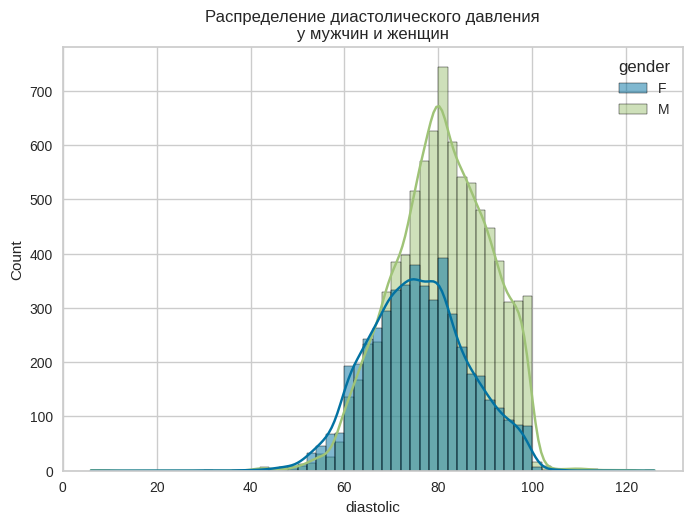

In [ ]:
# Построю гистограммы распределения диастолического давления для мужчин и женщин.
plt.title('Распределение диастолического давления\nу мужчин и женщин')
sns.histplot(data=data, bins=60, x='diastolic', kde=True, hue='gender');

Для людей, выполняющих физические упражнения, такие как приседания, прыжки с места, глубокие наклоны в положении сидя, сильные отклонения диастолического давления выглядят недостоверными и появившимися в результате ошибок измерения или записи. Таких аномальных значений всего два (у мужчин), поэтому их лучше заменить медианными значениями.

В распределении наблюдается максимум и у мужчин, и у женщин, на отметке 80 мм рт.ст. Это округленное измерение диастолического давления у здорового человека.

In [ ]:
data[~(data['diastolic']>=30)].shape

(2, 12)

Таких 2 строки.

In [ ]:
data.loc[data['diastolic']<30, 'diastolic'] = data.loc[data['gender']=='M', 'diastolic'].median()

In [ ]:
# Снова выведу  для диастолического давления ящик с усами отдельно для мужчин и для женщин.
px.box(data, x= 'diastolic', y='gender', title='Распределение диастолического (нижнего) давления у мужчин и женщин')

Удалил самые недостоверные значения.

In [ ]:
# Посмотрю зависимость возраста от диастолического давления для мужчин и женщин с линиями трендов.
px.scatter(data, x='diastolic', y='age', color='gender', trendline='ols', title='Распределение возраста в зависимости от диастолического давления у мужчин и женщин')

In [ ]:
# Коэффициент корреляции Пирсона между возрастом и диастолическим давлением.
data['age'].corr(data['diastolic']).round(4)

0.1598

In [ ]:
# Коэффициент корреляции между возрастом и диастолическим давлением у мужчин.
data.loc[data['gender']=='M', 'age'].corr(data['diastolic']).round(4)

0.1983

In [ ]:
# Коэффициент корреляции между возрастом и диастолическим давлением у женщин.
data.loc[data['gender']=='F', 'age'].corr(data['diastolic']).round(4)

0.1494

Зависимость возраста от диастолического давления есть и она практически одинакова у мужчин и женщин.
- Коэффициент корреляции между возрастом и диастолическим давлением у мужчин положительный и равен 0.1983 ($R^2=0.039$).
- У женщин коэффициент корреляции также положительный и равен 0.1494 ($R^2=0.022$).

Явных аномалий не осталось.

##### <b>Систолическое давление (systolic)</b>

In [ ]:
# Статистики систолического давления.
data['systolic'].describe()

count    13392.00000
mean       130.27397
std         14.60468
min         77.00000
25%        120.00000
50%        130.00000
75%        141.00000
max        201.00000
Name: systolic, dtype: float64

Среднее (130.27 мм рт.ст.) и медианное (130 мм рт.ст.) значения систолического давления практически совпадают. Стандартное отклонение 14.6 мм рт.ст. Максимальное значение 201 мм рт.ст., минимальное - 77 мм рт.ст.

In [ ]:
# Диаграмма размаха систолического давления отдельно для мужчин и для женщин.
px.box(data, x= 'systolic', y='gender', title='Распределение систолического (нижнего) давления у мужчин и женщин')

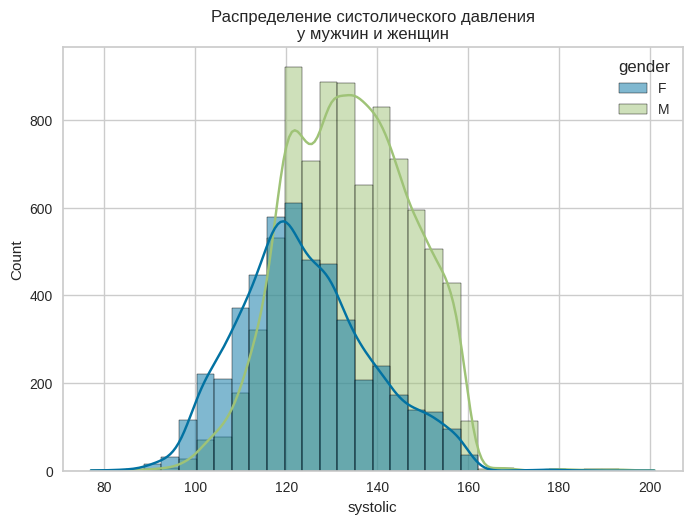

In [ ]:
# Построю гистограммы распределения систолического давления для мужчин и женщин.
plt.title('Распределение систолического давления\nу мужчин и женщин')
sns.histplot(data=data, bins=32, x='systolic', kde=True, hue='gender');

In [ ]:
# Построю диаграмму рассеяния для диастолического и систолического давления.
px.scatter(data, x='diastolic', y='systolic', trendline='ols', title='Распределение диастолического и систолического давления')

Медианное значение систолического давления у женщин (123 мм рт.ст.) очень близко к медицинскому стандарту 120/80 мм рт.ст. и существенно ниже, чем у мужчин (134 мм рт.ст.). А систолическое давление выше 140 - признак артериальной гипертензии. Больше четверти мужчин в выборке имеют верхнее давление выше 140 мм рт.ст. Это может свидетельствовать или о нерепрезентативности выборки (значительная часть мужчин в выборке имеют проблемы с сердечно-сосудистой системой) или о некорректности проведения измерений давления (например, после нагрузки верхнее давление может значительно повышаться, а измерение давления должно производиться в состоянии покоя).

Линия тренда соответствует значению пульсового давления 56.64 мм рт.ст., что выше верхней границы допустимого пульсового давлению (50 мм рт.ст.) для здоровых людей. Половина людей с пульсовым давлением выше 50 мм рт.ст. находятся в группе риска по сердечно-сосудистым заболеваниям. Возможно выборка людей была сделана среди не совсем здоровых людей, например в санатории или доме отдыха.

В распределениях заметны несколько максимумов и у мужчин, и у женщин (120, 130, 140 мм рт.ст.), связанных с округлением значений измерения давления.

Судя по всему, удаляя выбросы у пульсового и диастолического давлений, я автоматически избавился от выбросов в распределении систолического давления. Нельзя сказать, что значения 90 или 180 нормальные для верхнего давления, но они вполне возможны. Поэтому оставлю несколько имеющихся выбросов в датасете.

In [ ]:
# Посмотрю зависимость возраста от систолического давления для мужчин и женщин.
px.scatter(data, x='systolic', y='age', color='gender', trendline='ols', title='Распределение возраста в зависимости от систолического давления у мужчин и женщин')

In [ ]:
# Коэффициент корреляции Пирсона между возрастом и систолическим давлением.
data['age'].corr(data['systolic']).round(4)

0.2112

In [ ]:
# Коэффициент корреляции между возрастом и систолическим давлением у мужчин.
data.loc[data['gender']=='M', 'age'].corr(data['systolic']).round(4)

0.2003

In [ ]:
# Коэффициент корреляции между возрастом и систолическим давлением у женщин.
data.loc[data['gender']=='F', 'age'].corr(data['systolic']).round(4)

0.3092

У мужчин коэффициент корреляции целевого признака (возраст) и систолического давления положительный и равен 0.2003 (примерно такой же, как у диастолического давления). Коэффициент детерминации $R^2=0.040$.

У женщин коэффициент корреляции возраста и систолического давления также положительный и равен 0.3092 (в два раза выше, чем у диастолического). Коэффициент детерминации $R^2=0.096$.

Аномальных значений нет.

<b>*Можно сделать следующие выводы:*
- *Увеличение любого давления приводит к увеличению физиологического возраста.*
- *Физиологический возраст женщин значительно сильнее зависит от увеличения пульсового и (или) верхнего (систолического) давления чем у мужчин.*
- *Коэффициенты корреляции возраста от всех видов давления не превышают 0.3. Это значит, что давление не является определяющим фактором для определения физиологического возраста.*</b>

##### <b>Индекс массы тела (bmi)</b>

In [ ]:
# Статистики индекса массы тела.
data['bmi'].describe()

count    13392.000000
mean        23.606289
std          2.940873
min         11.103976
25%         21.612850
50%         23.463852
75%         25.341367
max         42.906509
Name: bmi, dtype: float64

Среднее (23.6) и медианное (23.46) значения индекса массы тела очень близки и находятся вблизи к верхней границе (25) нормального индекса массы тела. Стандартное отклонение 2.94 говорит о небольшом разбросе основной массы значений. Однако максимальное значение 42.9 соответствует ожирению 3 степени, а минимальное значение 11.1 - выраженному дефициту массы тела.

In [ ]:
# Диаграмма размаха индекса массы отдельно для мужчин и для женщин.
px.box(data, x= 'bmi', y='gender', title='Распределение индекса массы тела у мужчин и женщин')

Распределение индекса массы тела у женщин смещено в область меньших значений относительно распределения у мужчин (медианное значение BMI у мужчин равно 24.29, у женщин - 21.74). При этом величина межквартильного размаха практически совпадает. В распределениях наблюдаются выбросы как в большую, так и в меньшую сторону.

In [ ]:
# Выведу строки со значениями bmi меньше 15.
data[data['bmi']<15]

,age,gender,body_fat,diastolic,systolic,grip_forse,sit_ups,class,bmi,broad_jump_per_height,sit_and_bend_per_height,pulse_pressure
1182,44,M,19.3,74,127,45.7,52,1,13.521278,1.363360,0.102861,53
2891,24,M,9.0,81,137,55.0,56,1,11.314973,1.310233,0.106118,56
4370,63,F,37.0,73,120,27.2,0,4,11.103976,0.682261,0.050682,47
7550,21,F,31.9,64,110,27.7,42,2,11.904011,0.910202,0.151497,46
7944,45,F,16.1,81,124,6.7,8,4,14.321192,0.000000,0.074967,43
10295,26,F,34.5,85,137,2.1,38,1,12.702953,1.061893,0.188107,52


В строках 4370, 7550 и 10295 с низкими значениями индекса массы тел присутствуют значения с большой степенью ожирения body_fat (37, 31.9, 34.5). Это аномальные значения, так как при большой степени ожирения индекс массы тела  не может быть низким. Обратная ситуация возможна, ведь мышечная масса может увеличить индекс массы тела при минимальной степени ожирения. Например, у Арнольда Шварценеггера индекс массы тела больше 30.

Для выявления подобных аномалий построю диаграмму рассеяния индекса массы тела и степени ожирения.

In [ ]:
# Построю распределение степени ожирения в зависимости от индекса массы тела.
px.scatter(data, x='bmi', y='body_fat', color='gender', trendline='ols', title='Распределение степени ожирения в зависимости от индекса массы тела')

Линия тренда у женщин параллельна линии тренда мужчин, но находится выше по оси body_fat. <b>*То есть при одинаковой степени ожирения мужчины имеют более развитую мускулатуру, а соотвественно более высокий индекс массы тела.*</b>

На распределении видны четыре аномальных значения с высокой степенью ожирения и низким индексом массы тела выпадающих из общего тренда, которые необходимо откорректировать. Выбросы, находящиеся в тренде я оставлю в датасете.

In [ ]:
# Заменю аномальные значения степени ожирения на медианное значение.
data.loc[(data['body_fat']>30) & (data['bmi']<13), 'body_fat'] = data['body_fat'].median()
data.loc[data['body_fat']>70, 'body_fat'] = data['body_fat'].median()


In [ ]:
# Снова построю распределение степени ожирения в зависимости от индекса массы тела.
px.scatter(data, x='bmi', y='body_fat', color='gender', trendline='ols', title='Распределение степени ожирения в зависимости от индекса массы тела')

Аномальные значения заменены на медианные.

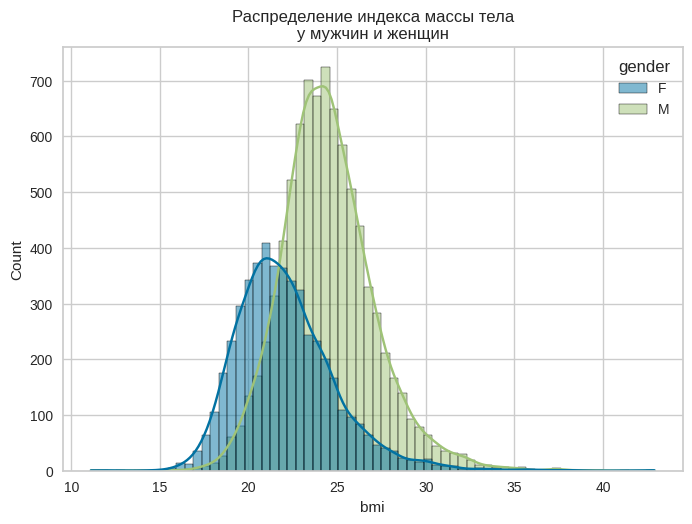

In [ ]:
# Построю гистограммы распределения индекса массы тела для мужчин и женщин.
plt.title('Распределение индекса массы тела\nу мужчин и женщин')
sns.histplot(data, bins=66, x='bmi', kde=True, hue='gender');

Индекс массы тела у мужчин и у женщин имеет распределение близкое к нормальному. Выбросы менее 15 и более 35, как было видно на предыдущем графике, находятся в тренде с основной массой измерений и поэтому были оставлены в датасете.



In [ ]:
# Посмотрю зависимость возраста от индекса массы тела для мужчин и женщин.
px.scatter(data, x='bmi', y='age', color='gender', trendline='ols', title='Распределение возраста в зависимости от индекса массы тела у мужчин и женщин')

In [ ]:
# Коэффициент корреляции Пирсона между возрастом и индексом массы тела.
data['age'].corr(data['bmi']).round(4)

0.0986

In [ ]:
# Коэффициент корреляции между возрастом и индексом массы тела у мужчин.
data.loc[data['gender']=='M', 'age'].corr(data['bmi']).round(4)

0.0413

In [ ]:
# Коэффициент корреляции между возрастом и индексом массы тела у женщин.
data.loc[data['gender']=='F', 'age'].corr(data['bmi']).round(4)

0.2656

У мужчин коэффициент корреляции целевого признака (возраст) и индекса массы тела равен 0.0413. Это практически нулевая корреляция. Коэффициент детерминации $R^2=0.002$.

У женщин коэффициент корреляции возраста и индекса массы тела положительный и равен 0.2656, что значительно выше, чем у мужчин. Коэффициент детерминации $R^2=0.07$.

В распределении наблюдаются сильные, но теоретически возможные, выбросы низкого индекса массы тела у пожилых людей и высокого индекеса массы тела у молодых. Эти строки были оставлены в распределении.

<b>*Увеличение индекса массы тела у мужчин практически не влияет на физиологический возраст, в то время, как у женщин с ростом индекса массы тела физиологический возраст заметно увеличивается.*</b>

##### <b>Степень ожирения (body_fat)</b>

In [ ]:
# Статистики степени ожирения.
data['body_fat'].describe()

count    13392.000000
mean        23.232843
std          7.239140
min          3.000000
25%         18.000000
50%         22.800000
75%         28.000000
max         54.900000
Name: body_fat, dtype: float64

Среднее (23.23) и медианное (22.8) значения близки. Стандартное отклонение 7.24. Максимальное значение 54.9, минимальное - 3.

В организме человека присутствует незаменимый жир. Он требуется для поддержания жизнедеятельности и репродуктивных функций. 4-6% считаются физиологическим минимумом для мужчин. Женщинам требуется для нормальной жизнедеятельности по коайней мере на 9% больше.

In [ ]:
# Диаграмма размаха степени ожирения отдельно для мужчин и для женщин.
px.box(data, x= 'body_fat', y='gender', title='Распределение степени ожирения у мужчин и женщин')

Распределение степени ожирения у женщин смещено в область больших значений относительно распределения у мужчин (медианное значение BF у мужчин равно 20.0%, у женщин - 28.3%). При этом величина межквартильного размаха практически совпадает. В распределениях наблюдаются выбросы как в большую, так и в меньшую сторону.

При изучении распределения степени ожирения в зависимости от индекса массы тела были оставлены только выбросы, находящиеся в тренде.

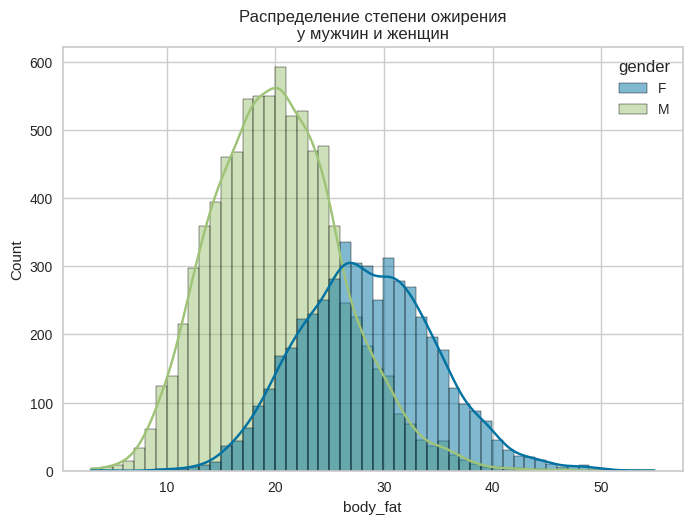

In [ ]:
# Построю гистограммы распределения степени ожирения для мужчин и женщин.
plt.title('Распределение степени ожирения\nу мужчин и женщин')
sns.histplot(data, bins=52, x='body_fat', kde=True, hue='gender');

Распределения симметричные, близкие к нормальному. Подозрительных аномалий не наблюдается.

In [ ]:
# Посмотрю зависимость возраста от степени ожирения для мужчин и женщин.
px.scatter(data, x='body_fat', y='age', color='gender', trendline='ols', title='Распределение возраста в зависимости от степени ожирения у мужчин и женщин')

In [ ]:
# Коэффициент корреляции Пирсона между возрастом и степенью ожирения.
data['age'].corr(data['body_fat']).round(4)

0.2436

In [ ]:
# Коэффициент корреляции между возрастом и степенью ожирения у мужчин.
data.loc[data['gender']=='M', 'age'].corr(data['body_fat']).round(4)

0.2451

In [ ]:
# Коэффициент корреляции между возрастом и степенью ожирения у женщин.
data.loc[data['gender']=='F', 'age'].corr(data['body_fat']).round(4)

0.2641

<b>*В отличие от индекса массы тела, степень ожирения влияет на физиологический возраст как у женщин, так и у мужчин. Увеличение степени ожирения приводит к увеличению физиологического возраста.*</b> Линии тренда практически параллельны. Коэффициент корреляции между возрастом и степенью ожирения у мужчин положительный и равен 0.2451 (Коэффициент детерминации $R^2=0.06$), у женщин также положительный - 0.2641 (Коэффициент детерминации $R^2=0.07$).

##### <b>Количество приседаний за две минуты (sit_ups)</b>

In [ ]:
# Статистики количества приседаний.
data['sit_ups'].describe()

count    13392.000000
mean        39.770311
std         14.277056
min          0.000000
25%         30.000000
50%         41.000000
75%         50.000000
max         80.000000
Name: sit_ups, dtype: float64

Среднее (39.77) и медианное (41) значения количества приседаний близки. Стандартное отклонение 14.28. Максимальное значение 80, минимальное - 0 приседаний за 2 минуты.

In [ ]:
# Диаграмма размаха количества приседаний отдельно для мужчин и для женщин.
px.box(data, x= 'sit_ups', y='gender', title='Распределение количества приседаний у мужчин и женщин')

Мужчины в основной массе приседают больше женщин. Медианное значение количества приседаний за две минуты у мужчин - 46, у женщин - 32. При этом как среди мужчин, так и среди женщин есть не присевшие ни разу. Максимальное значение 80 приседаний за две минуты не является невозможным.

In [ ]:
# Посмотрю, люди с каким уровнем здоровья приседают за 2 минуты 10 раз и меньше.
data.loc[data['sit_ups']<=10, 'class'].value_counts()

4    418
3     51
1      0
2      0
Name: class, dtype: int64

In [ ]:
# Посмотрю, люди с каким уровнем здоровья не смогли присесть ни разу.
data.loc[data['sit_ups']==0, 'class'].value_counts()

4    125
1      0
2      0
3      0
Name: class, dtype: int64

In [ ]:
# Посмотрю, сколько мужчин и сколько женщин не смогли присесть ни разу.
data.loc[data['sit_ups']==0, 'gender'].value_counts()

F    119
M      6
Name: gender, dtype: int64

In [ ]:
# Посмотрю, сколько людей младше 50 лет не смогли присесть ни разу.
data.loc[(data['sit_ups']==0)&(data['age']>50), 'gender'].value_counts()

F    95
M     1
Name: gender, dtype: int64

Менее 10 раз смогли присесть люди в основном с 4 и немного с 3 уровнями здоровья. Ни одного раза не смогли присесть 125 человек с  4 уровнем здоровья. Среди них 119 женщин (95 старше 50 лет) и 6 мужчин. Это вполне объяснимо.

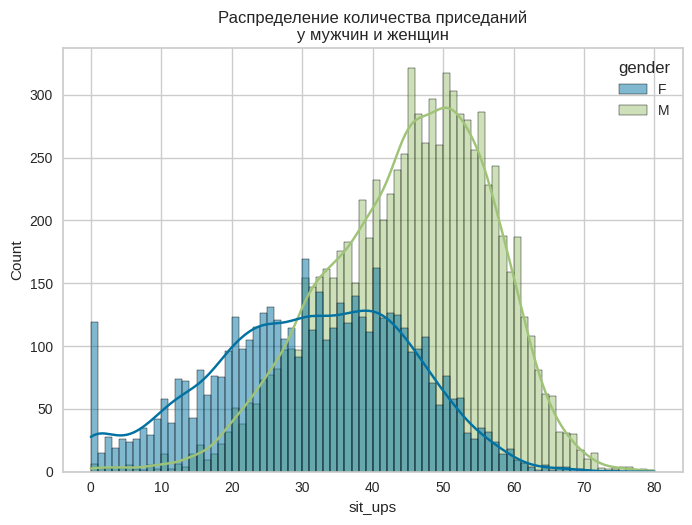

In [ ]:
# Построю гистограммы распределения количества приседаний для мужчин и женщин.
plt.title('Распределение количества приседаний\nу мужчин и женщин')
sns.histplot(data, bins=80, x='sit_ups', kde=True, hue='gender');

Распределения и у мужчин, и у женщин несимметричные, наблюдается скос влево в область меньших значений. На нулевой отметке  в распределении у женщин присутствует максимум. 6 мужчин и 119 женщин не смогли присесть ни разу. Люди, не присевшие ни разу, фактически отказались от учатия в исследовании, даже если это было сделано по объективным причинам. Поэтому нулевые значения я считаю необходимым удалить.

In [ ]:
# Удалю строки с нулевым количеством приседаний.
data = data[data['sit_ups']!=0]

In [ ]:
# Посмотрю зависимость возраста от количества приседаний для мужчин и женщин.
px.scatter(data, x='sit_ups', y='age', color='gender', trendline='ols', title='Распределение возраста в зависимости от количества приседаний у мужчин и женщин')

In [ ]:
# Коэффициент корреляции Пирсона между возрастом и количеством приседаний.
data['age'].corr(data['sit_ups']).round(4)

-0.5353

In [ ]:
# Коэффициент корреляции между возрастом и количеством приседаний у мужчин.
data.loc[data['gender']=='M', 'age'].corr(data['sit_ups']).round(4)

-0.5673

In [ ]:
# Коэффициент корреляции между возрастом и степенью ожирения у женщин.
data.loc[data['gender']=='F', 'age'].corr(data['sit_ups']).round(4)

-0.6018

<b>*Количество приседаний сильно влияет на физиологический возраст как у женщин, так и у мужчин. Уменьшение количества приседаний приводит к увеличению физиологического возраста.*</b> Линии тренда практически параллельны. Коэффициент корреляции между возрастом и количеством приседаний у мужчин отрицательный и равен -0.5673 (Коэффициент детерминации  $R^2=0.32$ ), у женщин также отрицательный - -0.6018 (Коэффициент детерминации  $R^2=0.36$).

Аномальные значения удалены.

##### <b>Нормированная длина прыжка с места (broad_jump_per_height)</b>

In [ ]:
# Статистики нормированной длины прыжка.
data['broad_jump_per_height'].describe()

count    13267.000000
mean         1.127297
std          0.200185
min          0.000000
25%          0.995658
50%          1.138790
75%          1.276405
max          1.748666
Name: broad_jump_per_height, dtype: float64

Среднее (1.127) и медианное (1.139) значения нормированной длины прыжка очень близки. Стандартное отклонение 0.20. Максимальное значение 1.75, минимальное - 0.

In [ ]:
# Диаграмма размаха нормированной длины прыжка отдельно для мужчин и для женщин.
px.box(data, x= 'broad_jump_per_height', y='gender', title='Распределение нормированной длины прыжка у мужчин и женщин')

Распределение длины прыжка с места у мужчин и у женщин во форме совпадают, но у мужчин распределение смещено в осторону больших значений (медианное значение для мужчин - 1.23 роста, для женщин - 0.98 роста. В распределениях присутствуют выбросы в большую и меньшую сторону. В том числе нулевые значения.

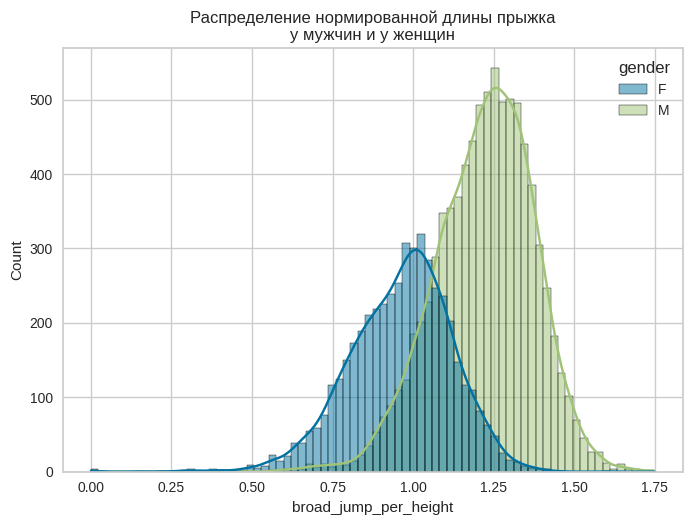

In [ ]:
# Построю гистограммы распределения длины прыжка с места для мужчин и женщин.
plt.title('Распределение нормированной длины прыжка\nу мужчин и у женщин')
sns.histplot(data, bins=76, x='broad_jump_per_height', kde=True, hue='gender');

Распределение длины прыжка с места у мужчин смещено относительно распределения у женщин в сторону больших значений. Оба распределения имеют скос в сторону меньших значений. Как и в случае с количеством приседаний, посчитаю людей с нулевым значением длины прыжка (небольшой пик на гистограмме на нулевой отметке) отказавшимися от участия в исследовании и удалю строки с ними.

In [ ]:
# Удалю строки с длиной прыжка, равной 0.
data = data[data['broad_jump_per_height']!=0.]

In [ ]:
# Посмотрю зависимость возраста от длины прыжка для мужчин и женщин.
px.scatter(data, x='broad_jump_per_height', y='age', color='gender', trendline='ols', title='Распределение возраста в зависимости от нормированной длины прыжка у мужчин и у женщин')

In [ ]:
# Коэффициент корреляции между возрастом и длиной прыжка у мужчин.
data.loc[data['gender']=='M', 'age'].corr(data['broad_jump_per_height']).round(4)

-0.4751

In [ ]:
# Коэффициент корреляции между возрастом и длиной прыжка у женщин.
data.loc[data['gender']=='F', 'age'].corr(data['broad_jump_per_height']).round(4)

-0.5346

<b>*Длина прыжка сильно влияет на физиологический возраст как у женщин, так и у мужчин. Уменьшение длины прыжка приводит к увеличению физиологического возраста.*</b> Линии тренда почти параллельны. Коэффициент корреляции между возрастом и длиной прыжка у мужчин отрицательный и равен -0.4751 (Коэффициент детерминации  $R^2=0.23$), у женщин также отрицательный - -0.5346 (Коэффициент детерминации  $R^2=0.29$).

Аномальные значения удалены.

##### <b>Нормированная глубина наклона вперед в положении сидя (sit_and_bend_per_height)</b>

In [ ]:
# Статистики нормированной глубины наклона вперед в положении сидя.
data['sit_and_bend_per_height'].describe()

count    13262.000000
mean         0.091187
std          0.051340
min         -0.145349
25%          0.063796
50%          0.095619
75%          0.124920
max          1.286232
Name: sit_and_bend_per_height, dtype: float64

Среднее (0.0912) и медианное (0.0956) значения нормированной на рост глубины наклона отличаются незначительно. Стандартное отклонение - 0.0513. Максимальное значение равно 1.28 и является аномальным. Минимальное - -0.1453.

In [ ]:
# Диаграмма размаха нормированной глубины наклона вперед сидя отдельно для мужчин и для женщин.
px.box(data, x= 'sit_and_bend_per_height', y='gender', title='Распределение нормированной глубины наклона вперед сидя у мужчин и женщин')

В распределении у мужчин есть два явно аномальных значения глубины наклона больше роста. Заменю их медианными значениями.

In [ ]:
# Заменю два аномальных значения медианными.
data.loc[data['sit_and_bend_per_height']>1, 'sit_and_bend_per_height'] = data['sit_and_bend_per_height'].median()

In [ ]:
# Новая диаграмма размаха для нормированной глубины наклона вперед сидя отдельно для мужчин и для женщин.
px.box(data, x= 'sit_and_bend_per_height', y='gender', title='Распределение нормированной глубины наклона вперед сидя у мужчин и женщин')

Измерение глубины наклона вперед в положении сидя (в йоге эта поза называется пашчимоттанасана) производится относительно положения ступней. В случае, когда удается дотянуться руками дальше положения ступней - значения положительные, в противном случае - отрицательные.

Распределение у женщин смещено относительно распределения у мужчин в сторону положительных значений (медианное значение у женщин равно 0.128 роста, у мужчин 0.082 роста). То есть женщины более гибкие. Подавляющее большинство людей успешно дотягиваются дальше своих ступней. Но и у мужчин, и у женщин есть люди, не сумевшие это сделать.

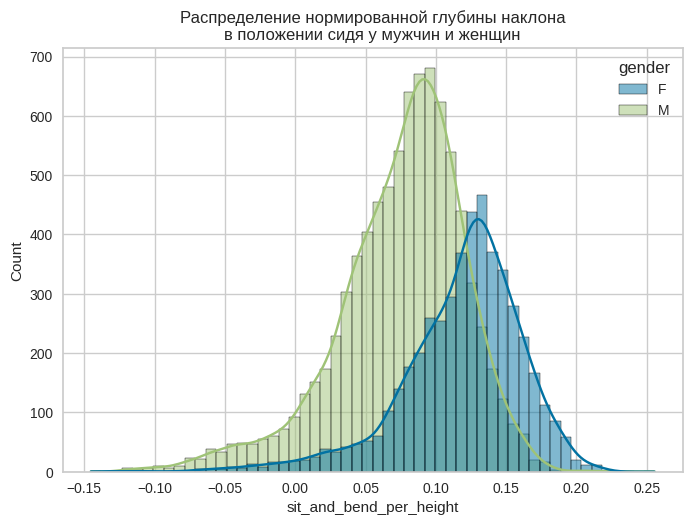

In [ ]:
# Построю гистограммы распределения нормированной глубины наклона для мужчин и женщин.
plt.title('Распределение нормированной глубины наклона\nв положении сидя у мужчин и женщин')
sns.histplot(data, bins=54, x='sit_and_bend_per_height', kde=True, hue='gender');

Распределение глубины наклона и у мужчин, и у женщин несимметричное, скошенное в сторону отрицательных значений. Форма распределения остроконечная. Аномальных выбросов нет.

In [ ]:
# Посмотрю зависимость возраста от нормированной глубины наклона в положении сидя для мужчин и женщин.
px.scatter(data, x='sit_and_bend_per_height', y='age', color='gender', trendline='ols',
           title='Распределение возраста в зависимости от нормированной глубины наклона в положении сидя у мужчин и женщин')

In [ ]:
# Коэффициент корреляции между возрастом и нормированной глубиной наклона у мужчин.
data.loc[data['gender']=='M', 'age'].corr(data['sit_and_bend_per_height']).round(4)

-0.0601

In [ ]:
# Коэффициент корреляции между возрастом и нормированной глубиной наклона у женщин.
data.loc[data['gender']=='F', 'age'].corr(data['sit_and_bend_per_height']).round(4)

-0.0801

<b>*Глубина наклона в положении сидя слабо влияет на физиологический возраст как у женщин, так и у мужчин. Уменьшение глубины наклона слегка увеличивает физиологический возраст.*</b> Линии тренда идут под небольшим углом друг от друга. Коэффициент корреляции между возрастом и глубиной наклона у мужчин отрицательный и равен -0.0601 (Коэффициент детерминации  $R^2=0.0036$), у женщин также отрицательный и равен  -0.0801 (Коэффициент детерминации  $R^2=0.0064$).

##### <b>Сила жима кисти (grip_forse)</b>

In [ ]:
# Статистики сылы жима кистью.
data['grip_forse'].describe()

count    13262.000000
mean        37.100740
std         10.563567
min          0.000000
25%         27.700000
50%         38.000000
75%         45.200000
max         70.500000
Name: grip_forse, dtype: float64

Среднее (37.1 кг) и медианное (38 кг) достаточно близки. Стандартное отклонение 10.56 кг. Максимальное значение 70.5 кг, минимальное - 0 кг.

In [ ]:
# Диаграмма размаха силы жима кисти отдельно для мужчин и для женщин.
px.box(data, x= 'grip_forse', y='gender', title='Распределение силы жима кисти у мужчин и женщин')

Распределения симметричные. Распределение силы жима кисти мужчин смещено относительно распределения силы жима женщин в сторону больших значений. В распределениях есть выбросы.

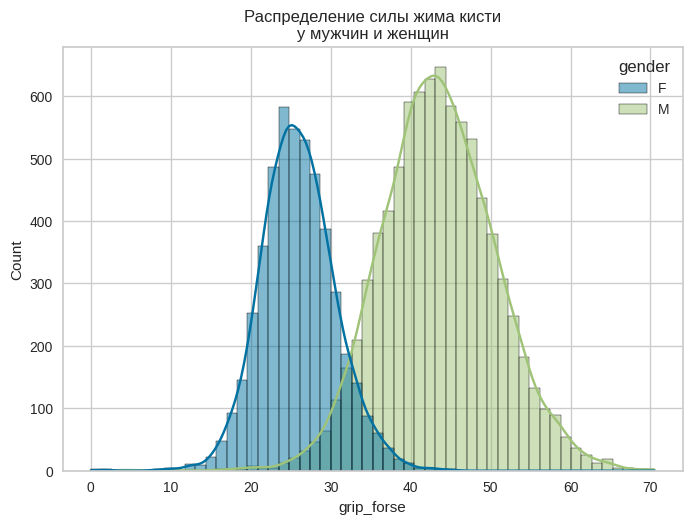

In [ ]:
# Построю гистограммы распределения силы жима кисти для мужчин и женщин.
plt.title('Распределение силы жима кисти\nу мужчин и женщин')
sns.histplot(data, bins=54, x='grip_forse', kde=True, hue='gender');

Маленькие значения силы жима кистью вызывают сомнение. Проверю, не являются ли они аномалиями. Для этого построю матрицу рассеяния между силой жима и количеством приседаний, предположив, что развитие мускулатуры идет равномерно по всем группам мышц.

In [ ]:
# Посмотрю зависимость количества приседаний от силы жима кисти для мужчин и женщин.
px.scatter(data, x='grip_forse', y='sit_ups', color='gender', trendline='ols',
           title='Распределение количества приседаний в зависимости от силы жима кисти у мужчин и женщин')

In [ ]:
# Посмотрю на эти строки.
data[data['grip_forse']<=5.3]

,age,gender,body_fat,diastolic,systolic,grip_forse,sit_ups,class,bmi,broad_jump_per_height,sit_and_bend_per_height,pulse_pressure
1852,24,F,42.1,88,131,1.6,39,4,28.530344,0.872567,0.102950,43
5805,28,M,36.6,99,155,3.5,35,4,31.515283,1.194539,0.030148,56
8562,22,F,34.2,79,111,0.0,45,4,20.327921,1.028678,0.094763,32
9486,45,M,9.3,72,127,0.0,43,2,19.076932,1.235499,0.054524,55
9768,27,M,20.2,99,153,0.0,56,3,27.925668,1.513921,0.099768,54
10295,26,F,22.8,85,137,2.1,38,1,12.702953,1.061893,0.188107,52
10801,46,M,17.2,75,145,4.4,60,2,24.440729,1.317399,0.085603,70
10948,29,M,12.7,67,104,5.3,53,1,24.062292,1.306851,0.101324,37


Это люди от 22 до 46 лет, имеющие различные уровни здоровья и приемлемый индекс массы тела, присевшие не менее 35 раз не могли иметь дакой слабый жим. Восемь значений с силой жима 5.3 кг и менее аномальны. Заменю их медианными значениями.

In [ ]:
data.loc[data['grip_forse']<=5.3, 'grip_forse'] = data['grip_forse'].median()

In [ ]:
# Посмотрю зависимость возраста от силы жима кисти для мужчин и женщин.
px.scatter(data, x='grip_forse', y='age', color='gender', trendline='ols',
           title='Распределение возраста в зависимости от силы жима кисти у мужчин и женщин')

In [ ]:
# Коэффициент корреляции между возрастом и силой жима кисти у мужчин.
data.loc[data['gender']=='M', 'age'].corr(data['grip_forse']).round(4)

-0.2206

In [ ]:
# Коэффициент корреляции между возрастом и силой жима кисти у женщин.
data.loc[data['gender']=='F', 'age'].corr(data['grip_forse']).round(4)

-0.2316

<b>*Сила жима кистью сильно влияет на физиологический возраст как у женщин, так и у мужчин. Уменьшение силы жима приводит к увеличению физиологического возраста.*</b> Коэффициент корреляции между возрастом и силой жима у мужчин отрицательный и равен -0.2206 (Коэффициент детерминации  $R^2=0.049$), у женщин также отрицательный -0.2316 (Коэффициент детерминации $R^2=0.053$).

Аномальных значений нет.

In [ ]:
# Посмотрю итоговый размер датасета.
data.shape

(13262, 12)

<b>*Изначально датасет содержал 12 столбцов и 13393 строки. После создания дополнительных и удаления неинформативных столбцов, а также после удаления аномалий в датасете осталось 13262 строки. Удалена 131 строка, что составляет чуть менее 1%.*</b>

#### <b>Изучение взаимной корреляции и выбор наиболее важных переменных.</b>

In [ ]:
# Построю матрицу корреляции признаков.
data_corr = data.corr()

In [ ]:
# Выведу тепловую карту корреляции.
px.imshow(data_corr, text_auto=True, aspect='auto', color_continuous_scale = 'RdYlBu', color_continuous_midpoint=0.)

Коэффициен корреляции Пирсона не рассчитывается для категориальных столбцов. Воспользуюсь коэффициентом корреляции $\phi_K$.

interval columns not set, guessing: ['age', 'body_fat', 'diastolic', 'systolic', 'grip_forse', 'sit_ups', 'bmi', 'broad_jump_per_height', 'sit_and_bend_per_height', 'pulse_pressure']


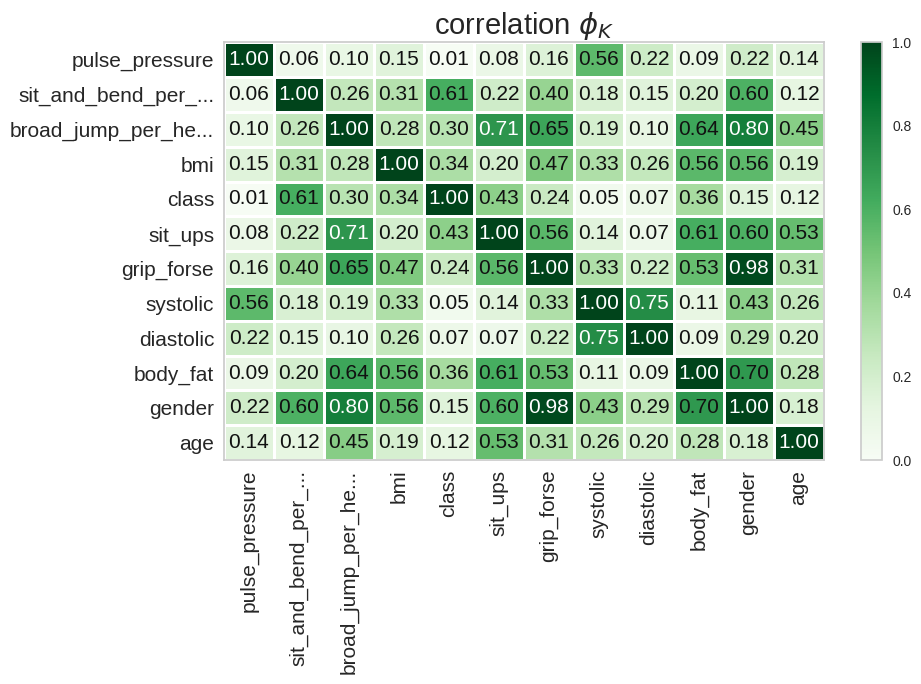

In [ ]:
data_corr_phik = data.phik_matrix()

plot_correlation_matrix(data_corr_phik.values,
                        x_labels=data_corr_phik.columns,
                        y_labels=data_corr_phik.index,
                        vmin=0, vmax=1, color_map='Greens',
                        title=r'correlation $\phi_K$',
                        fontsize_factor=1.5,
                        figsize=(10, 7))

<b>*Посмотрю, какое влияние оказывают признаки на целевой признак.*</b>
- Физиологический возраст зависит от всех признаков в датасете (Нулевых значений корреляции у признаков с целевым признаком нет).
- При этом нет признаков очень сильно влияющих на физиологический возраст. Самая большая отрицательная корреляция у физиологического возраста с количеством приседаний -0.5354 (Значение $\phi_K$=0.53). Это значит, что с увеличением возраста приседать людям становится труднее. Это утверждение похоже на правду для среднестатистического человека.
- Следующая, также отрицательная, величина корреляции Пирсона (-0.4164) между возрастом и нормированной длиной прыжка с места. Значение $\phi_K$=0.45. То есть с возрастом становится труднее далеко прыгнуть. Это утверждение также не вызывает отрицания.
- Остальные признаки имеют слабую корреляцию с физиологическим возрастом. Можно выделить корреляцию целевого признака со степенью ожирения 0.2281 ($\phi_K$=0.28), верхним 0.2141 ($\phi_K$=0.26) и нижним 0.1648 ($\phi_K$=0.20) давлением, силой жима кистью -0.1664 ($\phi_K$=0.31).
- Самое незначительное влияние на физиологический возраст оказывает глубина наклона в положении сидя 0.04254 ($\phi_K$=0.12).

<b>*Посмотрю на влияние признаков друг на друга.*</b>
- Сильнее всего взаимосвязаны длина прыжка и количество приседаний - коэффициент корреляции 0.7287 ($\phi_K$=0.71).

- На втором месте пульсовое и систолическое давление - коэффициент корреляции 0.6825 ($\phi_K$=0.56).

- На третьем месте связь между систолическим и диастолическим давлениями. Коэффициент корреляции 0.6822 ($\phi_K$=0.75).

- На четвертом месте длина прыжка и сила жима - коэффициент корреляции 0.6712 ($\phi_K$=0.65).

- На пятом месте длина прыжка и степень ожирения - коэффициент корреляции -0.6390 ($\phi_K$=0.64).


Люди, имеющие возможность далеко прыгнуть, физически развиты, а значит могут много раз присесть и имеют достаточную силу кисти. А чем выше степень ожирения, тем труднее прыгать.


- На удивление созданный столбец индекс массы тела имеет небольшую корреляцию со всеми признаками,  а пульсовое давление имеет высокую корреляцию только с верхним (систолическим) давлением (0.6825).
- Остальные взаимосвязи умеренные или слабые, кроме категорийного столбца gender. У него очень высокая корреляция с длиной прыжка ($\phi_K$=0.80) и силой жима кистью ($\phi_K$=0.98).

Наверное, мужчины могут дальше прыгнуть и сильнее сжать руку, но это не имеет значения для определения физиологического возраста. <b>*Признак gender имеет высокую мультиколлинеарность с двумя признаками, поэтому его необходимо удалить.*</b> Но если удалить гендерный признак, то все женщины будут определяться старше, чем мужчины. Есть два выхода: первый - рассматривать отдельно мужчин и женщин, второй - провести масштабирование отдельно для мужчин и женщин, а затем объединить датасеты, удалив гендерный признак. Я выбираю второй вариант.

In [ ]:
# Выведу матрицу диаграмм рассеяния по всем признакам.
fig = px.scatter_matrix(data)
fig.update_layout(title='Датасет "Body Performance data"', width=1600, height=1600,)

На диаграммах рассеяния действительно не видно очень высокой корреляции между признаками. Но и исключить какой либо признак из рассмотрения я пока не могу.

#### <b>Выводы.</b>

Исходные данные состояли из 12 столбцов и 13393 строк. В выборке участвовали мужчины и женщины с разным состоянием здоровья и физического развития от 21 до 64 лет. Распределение людей в выборке по уровням состояния здоровья равномерное, мужчин 63.2%, женщин 36.8%.

Данные содержали два категориальных признака: гендерный признак (gender) и экспертная оценка уровня здоровья (class). И 10 количественных признаков: возраст (age), рост (height), вес (weight), степень ожирения (body_fat), диастолическое (diastolic) и систолическое (systolic) артериальное давление, сила жима кисти (grip_forse), количество приседаний за 2 минуты (sit_ups), длина прыжка с места (broad_jump), глубина наклона вперед в положении сидя (sit_and_bend_forward). Категориальные столбцы имели тип object, количественные - float.

Пропусков в данных не было. Была обнаружена одна строка дубликат.

В реззультате подготовки данных было сделано:
- Названия столбцов были приведены к унифицированному виду.
- Категориальные столбцы были приведены к типу category (столбец class - с учетом порядка).
- Количественные столцы age (возраст), количество приседаний (sit_ups), длина прыжка с места (broad_jump), diastolic (нижнее артериальное давление) и systolic (верхнее артериальное давление) преобразованы к целочисленному типу int.
- Были созданы дополнительные признаки:
1. Пульсовое артериальное давление (pulse_pressure) как разность между верхним и нижним артериальными давлениями.
2. Индекс массы тела (bmi) на основании данных о росте и весе. Рост (height) и вес (weight) были удалены, как не имещие влияния на физиологический возраст.
- Признаки длина прыжка (broad_jump) и глубина наклона (sit_and_bend_forward) были номированы к росту участника.
- Были обнаружены и исправлены ошибки в данных:
1. В ряде строк систолическое давление оказалось ниже, чем диастолическое.  Исправлено взаимной заменой значений.
2. Недостоверно низкие значения пулсового давления (ниже 10 мм рт.ст.) и диастолического давления (меньше 30 мм рт.ст.), при том, что человек может приседать и прыгать, были заменены медианными значениями.
3. Аномальные значения степени ожирения, несоответствующие индексу массы тела, также были заменены медианными значениями.
4. Аномальные значения глубины наклона (значение глубины наклона больше роста) были заменены на медианные значения.
5. Люди, отказавшиеся (имеющие нулевые значения) измерять силу жима, выполнять приседания и прыжки с места, были удалены из выборки.
6. Аномальные значения силы жима менее 5.3 кг были заменены на медианные.

Распределения значений по всем измеряемым параметрам у мужчин и у женщин, кроме экспертной оценки уровня здоровья, очень сильно различаются. Судя по всему, все показатели следует рассматривать отдельно для мужчин и для женщин.
- Почти половина женщин и больше половины мужчин имеют пульсовое давление выше 50 мм рт.ст. и находятся в группе риска по сердечно-сосудистым заболеваниям.
- Медианное артериальное диастолическое (нижнее) артериальное давление у мужчин 81 мм рт.ст, у женщин - 75 мм рт.ст. В распределении диастолического давления наблюдается максимум на отметке 80 мм рт.ст. и у мужчин, и у женщин.  Это округленное измерение диастолического давления у здорового человека.
- Медианное значение систолического (верхнего) артериального давления у женщин (123 мм рт.ст.) очень близко к медицинскому стандарту 120/80 мм рт.ст. и существенно ниже, чем у мужчин (134 мм рт.ст.). А систолическое давление выше 140 - признак артериальной гипертензии. Больше четверти мужчин в выборке имеют верхнее давление выше 140 мм рт.ст. Это может свидетельствовать или о нерепрезентативности выборки (значительная часть мужчин в выборке имеют проблемы с сердечно-сосудистой системой) или о некорректности проведения измерений давления (например, после нагрузки верхнее давление может значительно повышаться, а измерение давления должно производиться в состоянии покоя).

*Можно сказать, что:*
1. *Увеличение любого давления приводит к увеличению физиологического возраста.*
2. *Физиологический возраст женщин значительно сильнее зависит от увеличения пульсового и (или) верхнего (систолического) давления чем у мужчин.*
3. *Коэффициенты корреляции возраста от всех видов давления не превышают 0.3. Это значит, что давление не является определяющим фактором для определения физиологического возраста.*


- Распределение индекса массы тела у женщин смещено в область меньших значений относительно распределения у мужчин (медианное значение BMI у мужчин равно 24.29, у женщин - 21.74). При этом величина межквартильного размаха практически совпадает. Мужчины имеют более развитую мускулатуру, а соотвественно более высокий индекс массы тела.
- В организме человека присутствует незаменимый жир. Он требуется для поддержания жизнедеятельности и репродуктивных функций. 4-6% считаются физиологическим минимумом для мужчин. Женщинам требуется для нормальной жизнедеятельности по крайней мере на 9% больше. Распределение степени ожирения у женщин смещено в область больших значений относительно распределения у мужчин (медианное значение BF у мужчин равно 20.0%, у женщин - 28.3%).
- Мужчины в основной массе приседают больше женщин. Медианное значение количества приседаний за две минуты у мужчин - 46, у женщин - 32. Количество приседаний сильно влияет на физиологический возраст как у женщин, так и у мужчин. Уменьшение количества приседаний приводит к увеличению физиологического возраста.
- Распределение длины прыжка с места у мужчин смещено относительно распределения у женщин в сторону больших значений. Оба распределения имеют скос в сторону меньших значений.
- Измерение глубины наклона вперед в положении сидя (в йоге эта поза называется пашчимоттанасана) производится относительно положения ступней. В случае, когда удается дотянуться руками дальше положения ступней - значения положительные, в противном случае - отрицательные. Распределение у женщин смещено относительно распределения у мужчин в сторону положительных значений (медианное значение у женщин равно 0.128 роста, у мужчин 0.082 роста). То есть женщины более гибкие. Подавляющее большинство людей успешно дотягиваются дальше своих ступней. Но и у мужчин, и у женщин есть люди, не сумевшие это сделать.
- Распределения значений силы жима у мужчин и у женщин симметричные. Распределение силы жима кисти мужчин смещено относительно распределения силы жима женщин в сторону больших значений более чем на 15 кг.


<b>*Влияние показателей здоровья и результатов выполнения физических упражнений на физиологический возраст.*</b>
- Физиологический возраст зависит от всех признаков в датасете (Нулевых значений корреляции у признаков с целевым признаком нет).
- При этом нет признаков очень сильно влияющих на физиологический возраст. Самая большая отрицательная корреляция у физиологического возраста с количеством приседаний -0.5354 (Значение $\phi_K$=0.53). Это значит, что с увеличением возраста приседать людям становится труднее. Это утверждение похоже на правду для среднестатистического человека.
- Следующая, также отрицательная, величина корреляции Пирсона (-0.4164) между возрастом и нормированной длиной прыжка с места. Значение $\phi_K$=0.45. То есть с возрастом становится труднее далеко прыгнуть. Это утверждение также не вызывает отрицания.
- Остальные признаки имеют слабую корреляцию с физиологическим возрастом. Можно выделить корреляцию целевого признака со степенью ожирения 0.2281 ($\phi_K$=0.28), верхним 0.2141 ($\phi_K$=0.26) и нижним 0.1648 ($\phi_K$=0.20) давлением, силой жима кистью -0.1664 ($\phi_K$=0.31).
- Самое незначительное влияние на физиологический возраст оказывает глубина наклона в положении сидя 0.04254 ($\phi_K$=0.12).

<b>*Влияние показателей друг на друга.*</b>
- Сильнее всего взаимосвязаны длина прыжка и количество приседаний - коэффициент корреляции 0.7287 ($\phi_K$=0.71).
- На втором месте пульсовое и систолическое давление - коэффициент корреляции 0.6825 ($\phi_K$=0.56).
- На третьем месте связь между систолическим и диастолическим давлениями. Коэффициент корреляции 0.6822 ($\phi_K$=0.75).
- На четвертом месте длина прыжка и сила жима - коэффициент корреляции 0.6712 ($\phi_K$=0.65).
- На пятом месте длина прыжка и степень ожирения - коэффициент корреляции -0.6390 ($\phi_K$=0.64).


Люди, имеющие возможность далеко прыгнуть, физически развиты, а значит могут много раз присесть и имеют достаточную силу кисти. А чем выше степень ожирения, тем труднее прыгать.

<b>Сильные различия в зависимости физиологического возраста от измеряемых параметров здоровья и физического развития у женщин и мужчин вынуждают решать задачу пргнозирования физиологического возраста раздельно.</b>

### <b>Подготовка данных к машинному обучению.</b>

<b>*Разделю датасет на тренировочную и тестовую выборки.*</b>

In [ ]:
# Разделю датасет на признаки и целевой признак.
X = data.drop('age', axis=1)
y = data['age']
X.shape, y.shape

((13262, 11), (13262,))

In [ ]:
# Разделю признаки и целевой признак на тренировочную и тестовую выборки в соотношении 80:20.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=20)
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((10609, 11), (10609,), (2653, 11), (2653,))

<b>*Сделаю нормализацию признаков.*</b>

В датасете есть признак gender (гендерный признак), который не должен влиять на физиологический возраст, но влияет на большинство параметров, связанных с физическими упражнениями. Попробую исключить это влияние. Для этого наборы признаков разделю на наборы для женщин и для мужчин, удалю гендерный признак и проведу масштабирование отдельно, а затем объединю их обратно.

Масштабировать буду все признаки, так как единственный в датасете 'gender' с нечисленными значениями будет удален. Для масштабирования буду использовать метод Standard Scaler из библиотеки sklearn, так как он не только масштабирует, но и нормализует признаки, то есть делает распределение со средним, равным нулю и дисперсией, равной единице.

In [ ]:
# Создам функцию для нормализации данных, содержащих целевой признак.
def scaler(train, test):
  sc = StandardScaler()
  y_tr = train['age']
  y_te = test['age']
  x_tr = train.drop('age', axis=1)
  x_te = test.drop('age', axis=1)
  train_new = pd.DataFrame(sc.fit_transform(x_tr), columns=x_tr.columns, index=x_tr.index)
  test_new = pd.DataFrame(sc.transform(x_te), columns=x_te.columns, index=x_te.index)
  train_new['age'] = y_tr
  test_new['age'] = y_te
  return train_new, test_new

In [ ]:
# Добавлю целевой признак к признакам в тренировочной и тестовой выборках.
X_train['age'] = y_train
X_test['age'] = y_test

In [ ]:
# Разделю данные на данные для мужчин и для женщин и удалю гендерный признак.
X_train_m = X_train[X_train['gender']=='M'].drop('gender', axis=1)
X_train_f = X_train[X_train['gender']=='F'].drop('gender', axis=1)
X_test_m = X_test[X_test['gender']=='M'].drop('gender', axis=1)
X_test_f = X_test[X_test['gender']=='F'].drop('gender', axis=1)

In [ ]:
# Использую созданную функцию для нормализации разделенных данных.
X_train_m_new, X_test_m_new = scaler(X_train_m, X_test_m)
X_train_f_new, X_test_f_new = scaler(X_train_f, X_test_f)

In [ ]:
# Посмотрю, как выглядят данные после нормализации.
X_train_m_new.head()

,body_fat,diastolic,systolic,grip_forse,sit_ups,class,bmi,broad_jump_per_height,sit_and_bend_per_height,pulse_pressure,age
11074,2.402148,1.489802,1.502588,-0.139133,-0.602367,1.308811,2.823203,-1.553440,-1.598885,0.463079,38
1657,-0.454024,0.325655,0.537797,0.694091,0.940554,-0.513861,0.523038,0.334152,-0.204496,0.367946,28
5213,-0.876535,0.034618,0.834656,0.679969,-0.345213,0.397475,0.136809,0.251158,0.673705,1.033880,38
2755,0.407898,0.325655,-1.020710,-0.661663,-2.316723,1.308811,-0.496180,-1.451965,-1.784894,-1.629855,63
4914,-1.704656,-0.741479,-1.317569,0.242173,0.683400,-0.513861,-0.560786,0.210647,1.002035,-0.963921,21


Все признаки нормализованы, кроме целевого признака.

In [ ]:
# Посмотрю размер получившихся датасетов.
X_train_m_new.shape, X_train_f_new.shape, X_test_m_new.shape, X_test_f_new.shape

((6734, 11), (3875, 11), (1725, 11), (928, 11))

In [ ]:
# Посмотрю, не возникли ли пропуски.
X_train_m_new.isna().sum().sum()

0

In [ ]:
# Соединю и трижды перемешаю датасеты.
X_train_new = pd.concat([X_train_m_new, X_train_f_new], axis=0).sample(frac=1, random_state=20).sample(frac=1, random_state=20).sample(frac=1, random_state=20)
X_test_new = pd.concat([X_test_m_new, X_test_f_new], axis=0).sample(frac=1, random_state=20).sample(frac=1, random_state=20).sample(frac=1, random_state=20)

In [ ]:
# Посмотрю размер получившихся датасетов.
X_train_new.shape, X_test_new.shape

((10609, 11), (2653, 11))

In [ ]:
# Снова выделю целевой признак из датасетов.
y_train_new = X_train_new['age']
y_test_new = X_test_new['age']

In [ ]:
# Удалю целевой признак из датасетов с признаками.
X_train_new = X_train_new.drop('age', axis=1)
X_test_new = X_test_new.drop('age', axis=1)

Признаки масштабированы раздельно для мужчин и женщин и снова собраны в один датасет. Признак gender удален. Перехожу к машинному обучению.

<b>*Посмотрю на распределения нормализованных данных.*</b>

In [ ]:
px.box(X_train_new)

Output hidden; open in https://colab.research.google.com to view.

Все признаки имеют симметричные, близкие к нормальному распределения.

<b>Выводы:</b>
- Данные были разделены на тренировочную и тестовую выборки в соотношении 80:20.
- Сильные различия в зависимости физиологического возраста от измеряемых параметров здоровья и физического развития вынуждают решать задачу прогнозирования раздельно для мужчин и для женщин. Чтобы избежать этого, распределения признаков были нормализованы раздельно для мужчин и для женщин, а затем данные были снова объеденины. Признак gender был удален.
- Данные подготовлены к машинному обучению.

### <b>Построение моделей машинного обучения.</b>

In [ ]:
model = []
r2train = []
maetrain = []
r2test = []
maetest =[]

#### <b>Линейная регрессия</b>

In [ ]:
model.append('Линейная регрессия')

In [ ]:
# Построю модель линейная регрессия.
lr = LinearRegression()
# Обучу ее на тренировочной выборке без подбора гиперпараметров.
lr.fit(X_train_new, y_train_new)

LinearRegression()

In [ ]:
# Создам функцию табличного и графического представления коэффициентов линейных моделей.
def linear_coef(linear_model):
  param_model = (pd.DataFrame(
      {'Coef':[linear_model.intercept_]+list(linear_model.coef_), 'Features':['intercept']+list(X_train_new.columns)}).sort_values(by='Coef', ascending=False))
  display(param_model)
  print()
  # Выведу важность признаков на график.
  fig, ax = plt.subplots(figsize=(10,4))
  bars = plt.barh(param_model['Features'], param_model['Coef'], color = 'teal')
  ax.xaxis.set_visible(False)
  ax.set_title('Диаграмма коэффициентов у признаков', fontsize=12)
  ax.bar_label(bars, fmt='%.3f')
  plt.show();
  return

,Coef,Features
0,36.510793,intercept
2,2.693783,diastolic
10,2.374459,pulse_pressure
7,1.555004,bmi
9,0.551887,sit_and_bend_per_height
4,-0.994259,grip_forse
1,-1.236273,body_fat
3,-1.474016,systolic
8,-3.889184,broad_jump_per_height
6,-5.320018,class


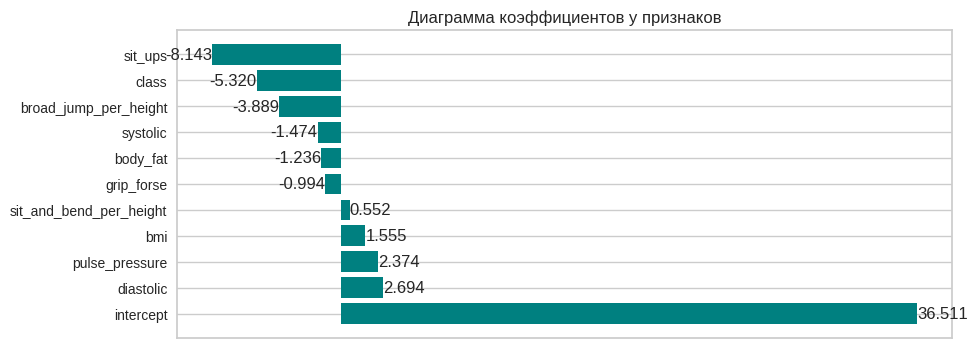

In [ ]:
linear_coef(lr)

Самый большой по абсолютному значению и отрицательный по знаку коэффициент у количества приседаний (-8.143). На втором месте уровень здоровья с отрицательным коэффициентом (-5.320). На третьем месте длина прыжка с отрицательным коэффициентом (-3.889).

Самый низкий коэффициент у глубины наклона в положении сидя (0.552).

<b>*Определение необходимости признаков*</b>

In [ ]:
# Создам функцию определения признаков, подлежащих удалению.
def my_rfecv(model, X_train):
  rfecv = RFECV(estimator=model, step=1, cv=5)
  display(rfecv)
  print()
  rfecv.fit(X_train, y_train_new)
  print("Optimal number of features : %d" % rfecv.n_features_)
  display(rfecv.support_)
  return list(np.array(rfecv.support_))

In [ ]:
# Определю необходимость признаков для обучения модели.
column_lr = my_rfecv(lr, X_train_new)

RFECV(cv=5, estimator=LinearRegression())


Optimal number of features : 10


array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True])

Для обучения линейной регрессии нужны все признаки.

In [ ]:
print('Модели для обучения нужны признаки:')
column_lr = list(X_train_new.loc[:,column_lr].columns)
column_lr

Модели для обучения нужны признаки:


['body_fat',
 'diastolic',
 'systolic',
 'grip_forse',
 'sit_ups',
 'class',
 'bmi',
 'broad_jump_per_height',
 'sit_and_bend_per_height',
 'pulse_pressure']

In [ ]:
# Снова создам модель линейная регрессия.
lr = LinearRegression()
# Обучу ее на тренировочной выборке без подбора гиперпараметров.
lr.fit(X_train_new[column_lr], y_train_new)

LinearRegression()

In [ ]:
# Создам функцию для расчета метрик.
def metrics(y, predict, text):
  print('На', text, 'выборке')
  r2 = round(r2_score(y, predict),3) # Коэффициент детерминации.
  print('R\u00B2 =', r2)
  mae = round(mean_absolute_error(y, predict),3) # Средняя абсолютная ошибка.
  print('MAE =', mae)
  return r2, mae

In [ ]:
# Сделаю предсказание на тренировочных данных и выведу значения метрик.
lr_predicted_train = lr.predict(X_train_new[column_lr])
r2, mae = metrics(y_train_new, lr_predicted_train, 'тренировочной')
r2train.append(r2)
maetrain.append(mae)

На тренировочной выборке
R² = 0.514
MAE = 7.609


Значение коэффициента детерминации 0.514 на тренировочной выборке невелико, что говорит о том, что модель плохо обучилась. Абсолютная ошибка более 7 лет при среднем возрасте 36.77 лет слишком велика.

<b>*Проверю модель на тестовых данных*</b>

In [ ]:
# Построю прогноз физиологического возраста на тестовых данных и выведу значения метрик.
lr_predicted_test = lr.predict(X_test_new[column_lr])
r2, mae = metrics(y_test_new, lr_predicted_test, 'тестовой')
r2test.append(r2)
maetest.append(mae)

На тестовой выборке
R² = 0.512
MAE = 7.739


На тестовой выборке значения метрик несколько хуже, чем на тренировочной. Судя по всему модель линейная регрессия недообучилась.

#### <b>Стохастический градиентный спуск</b>

In [ ]:
model.append('Стохастический градиентный спуск')

In [ ]:
# Создам модель стохастического градиентного спуска.
sgd = SGDRegressor(random_state=20)
# Обучу ее на тренировочной выборке без подбора гиперпараметров.
sgd.fit(X_train_new, y_train_new)

SGDRegressor(random_state=20)

,Coef,Features
0,[36.42461712931204],intercept
7,1.579817,bmi
2,1.110147,diastolic
10,0.848897,pulse_pressure
3,0.711966,systolic
9,0.668116,sit_and_bend_per_height
4,-1.147186,grip_forse
1,-1.276174,body_fat
8,-3.632138,broad_jump_per_height
6,-5.550229,class


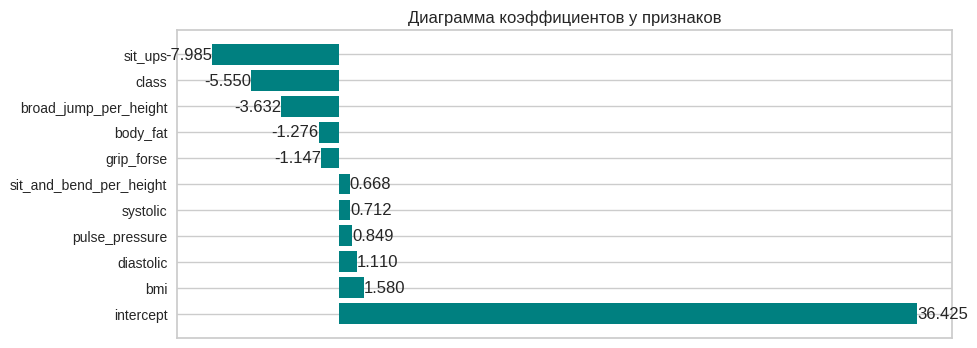

In [ ]:
linear_coef(sgd)

У модели градиентный спуск три самых важных признака (количество приседаний (-7.985), уровень здоровья (-5.550), длина прыжка (-3.632))  и самый слабый (глубина наклона (0.668)) такие же, как у линейной регрессии. Второстепенные признаки распределены по другому.

In [ ]:
# Определю необходимость признаков для обучения модели.
column_sgd = my_rfecv(sgd, X_train_new)

RFECV(cv=5, estimator=SGDRegressor(random_state=20))


Optimal number of features : 9


array([ True,  True,  True,  True,  True,  True,  True,  True, False,
        True])

Модели нужно только 9 признаков.

In [ ]:
print('Модели для обучения нужны признаки:')
column_sgd = list(X_train_new.loc[:,column_sgd].columns)
column_sgd

Модели для обучения нужны признаки:


['body_fat',
 'diastolic',
 'systolic',
 'grip_forse',
 'sit_ups',
 'class',
 'bmi',
 'broad_jump_per_height',
 'pulse_pressure']

Исключили признак глубина наклона.

In [ ]:
# Снова создам модель стохастического градиентного спуска.
sgd = SGDRegressor(random_state=20)
# Обучу ее на тренировочной выборке без подбора гиперпараметров.
sgd.fit(X_train_new[column_sgd], y_train_new)

SGDRegressor(random_state=20)

In [ ]:
# Сделаю предсказание на тренировочных данных и выведу значения метрик.
sgd_predicted_train = sgd.predict(X_train_new[column_sgd])
r2, mae = metrics(y_train_new, sgd_predicted_train, 'тренировочной')
r2train.append(r2)
maetrain.append(mae)

На тренировочной выборке
R² = 0.511
MAE = 7.654


Градиентный спуск показал на тренировочной выборке $R^2$=0.511 и MAE=7.654, почти также, как и линейная регрессия.

<b>*Проверю модель на тестовых данных*</b>

In [ ]:
# Построю прогноз физиологического возраста на тестовых данных и выведу значения метрик.
sgd_predicted_test = sgd.predict(X_test_new[column_sgd])
r2, mae = metrics(y_test_new, sgd_predicted_test, 'тестовой')
r2test.append(r2)
maetest.append(mae)

На тестовой выборке
R² = 0.51
MAE = 7.799


На тестовом наборе данных значения коэффициента детерминации еще ниже ($R^2$=0.51), а средняя абсолютная ошибка больше (7.799 лет). Значения такие же, как у линейной регрессии. Метрики на тестовой выборке чуть хуже, чем на тренировочной и невелики - признак недообучения.

#### <b>Дерево решений</b>

In [ ]:
model.append('Дерево решений')

In [ ]:
# Создам модель дерева решений.
tree = DecisionTreeRegressor(random_state=20)
# Обучу ее на тренировочной выборке без подбора гиперпараметров.
tree.fit(X_train_new, y_train_new)

DecisionTreeRegressor(random_state=20)

In [ ]:
# Создам функцию для определения важности признаков и ее графического представления.
def my_features_importance(model, X_train, k=1):
  param_model = pd.DataFrame({'Features' : X_train.columns,'Importance':model.feature_importances_ / k}, index=X_train.columns).sort_values('Importance')
  display(param_model)
  print()
  # Выведу важность признаков на график.
  fig, ax = plt.subplots(figsize=(10,4))
  bars = plt.barh(param_model['Features'], param_model['Importance'], color = 'teal')
  ax.xaxis.set_visible(False)
  ax.set_title('Диаграмма важности признаков', fontsize=12)
  ax.bar_label(bars, fmt='%.3f')
  plt.show();
  return

,Features,Importance
diastolic,diastolic,0.039837
pulse_pressure,pulse_pressure,0.042522
body_fat,body_fat,0.043173
sit_and_bend_per_height,sit_and_bend_per_height,0.049259
systolic,systolic,0.050201
bmi,bmi,0.054680
grip_forse,grip_forse,0.056519
broad_jump_per_height,broad_jump_per_height,0.093679
class,class,0.139067
sit_ups,sit_ups,0.431063


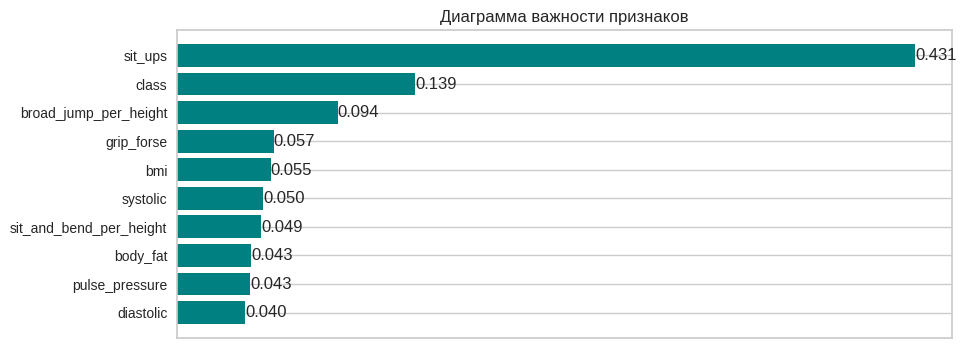

In [ ]:
# Посмотрю важность признаков.
my_features_importance(tree, X_train_new)

Самый важный признак для дерева решений это количество приседаний (0.431). Этот признак гораздо важнее остальных. На втором месте уровень здоровья (0.139) и на третьем - длина прыжка (0.094). Остальные признаки имеют важность ниже. Самый слабый признак - диастолическое (нижнее) давление (0.040).

In [ ]:
# Определю необходимость признаков для обучения модели.
column_tree = my_rfecv(tree, X_train_new)

RFECV(cv=5, estimator=DecisionTreeRegressor(random_state=20))


Optimal number of features : 10


array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True])

Модели для обучения нужны все признаки.

In [ ]:
print('Модели для обучения нужны признаки:')
column_tree = list(X_train_new.loc[:,column_tree].columns)
column_tree

Модели для обучения нужны признаки:


['body_fat',
 'diastolic',
 'systolic',
 'grip_forse',
 'sit_ups',
 'class',
 'bmi',
 'broad_jump_per_height',
 'sit_and_bend_per_height',
 'pulse_pressure']

In [ ]:
# Снова создам модель дерева решений, но уже на данных без ненужных признаков.
tree = DecisionTreeRegressor(random_state=20)
# Обучу ее на тренировочной выборке без ненужных признаков и без подбора гиперпараметров.
tree.fit(X_train_new[column_tree], y_train_new)

DecisionTreeRegressor(random_state=20)

In [ ]:
# Сделаю предсказание на тренировочных данных и выведу значения метрик.
tree_predicted_train = tree.predict(X_train_new[column_tree])
r2, mae = metrics(y_train_new, tree_predicted_train, 'тренировочной')
r2train.append(r2)
maetrain.append(mae)

На тренировочной выборке
R² = 1.0
MAE = 0.0


Коэффициент детерминации на тренировочной выборке равен 1. Значение абсолютной ошибки равно нулю. Модель переобучилась.

In [ ]:
# Посмотрю количество листьев в обученном дереве.
tree.get_n_leaves()

8336

In [ ]:
# Посмотрю глубину дерева
tree.get_depth()

32

В результате обучения получилось дерево глубиной 32 с 8336 листами. Не удивительно, что такое большое дерево переобучилось.

In [ ]:
# Визуализирую обученное дерево решений.
#viz_model = dtreeviz.model(model=tree, X_train=X_train_new, y_train=y_train_new, target_name='age', feature_names=X_train_m.columns)

In [ ]:
#viz_model.view(scale=1.5)

In [ ]:
# Построю прогноз физиологического возраста на тестовых данных и выведу значения метрик.
tree_predicted_test = tree.predict(X_test_new[column_tree])
r2, mae = metrics(y_test_new, tree_predicted_test, 'тестовой')
r2test.append(r2)
maetest.append(mae)

На тестовой выборке
R² = 0.238
MAE = 8.619


На тестовой выборке значения метрик очень низкие ($R^2$=0.238, MAE=8.619). Это хуже, чем у линейных моделей. Модель решающее дерево переобучилась.

#### <b>Случайный лес</b>

In [ ]:
model.append('Случайный лес')

In [ ]:
# Создам модель случайный лес.
rf = RandomForestRegressor(random_state=20)
# Обучу ее на тренировочной выборке без подбора гиперпараметров.
rf.fit(X_train_new, y_train_new)

RandomForestRegressor(random_state=20)

,Features,Importance
diastolic,diastolic,0.038125
pulse_pressure,pulse_pressure,0.040559
body_fat,body_fat,0.047391
systolic,systolic,0.048162
sit_and_bend_per_height,sit_and_bend_per_height,0.048310
grip_forse,grip_forse,0.052682
bmi,bmi,0.057597
broad_jump_per_height,broad_jump_per_height,0.095076
class,class,0.138581
sit_ups,sit_ups,0.433518


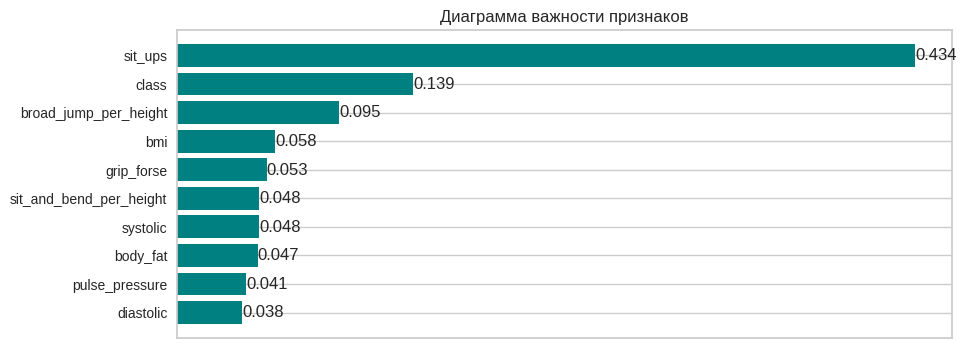

In [ ]:
# Посмотрю важность признаков.
my_features_importance(rf, X_train_new)

У случайного леса самый важный признак тоже количество приседаний (0.434). Остальные признаки имеют важность значительно ниже, но как и у решающего дерева, на втором месте уровень здоровья (0.139) и на третьем длина прыжка (0.095). Самый слабый признак - диастолическое (нижнее) давление (0.038).

In [ ]:
# Определю необходимость признаков для обучения модели.
column_rf = my_rfecv(rf, X_train_new)

RFECV(cv=5, estimator=RandomForestRegressor(random_state=20))


Optimal number of features : 9


array([ True, False,  True,  True,  True,  True,  True,  True,  True,
        True])

Для обучения модели случайный лес нужны 9 признаков.

In [ ]:
print('Модели для обучения нужны признаки:')
column_rf = list(X_train_new.loc[:,column_rf].columns)
column_rf

Модели для обучения нужны признаки:


['body_fat',
 'systolic',
 'grip_forse',
 'sit_ups',
 'class',
 'bmi',
 'broad_jump_per_height',
 'sit_and_bend_per_height',
 'pulse_pressure']

Исключили признак диастолическое артериальное давление.

In [ ]:
# Снова создам модель случайный лес.
rf = RandomForestRegressor(random_state=20)
# Обучу ее на тренировочной выборке без подбора гиперпараметров.
rf.fit(X_train_new[column_rf], y_train_new)

RandomForestRegressor(random_state=20)

In [ ]:
# Сделаю предсказание на тренировочных данных.
rf_predicted_train = rf.predict(X_train_new[column_rf])
r2, mae = metrics(y_train_new, rf_predicted_train, 'тренировочной')
r2train.append(r2)
maetrain.append(mae)

На тренировочной выборке
R² = 0.946
MAE = 2.366


Случайный лес на тренировочной выборке показал значение коэффициента детерминации $R^2$=0.946 и среднюю абсолютную ошибку 2.366 года. Это хороший результат. Но нужно посмотреть, как модель проявит себя на тестовых данных.

In [ ]:
# Построю прогноз физиологического возраста на тестовых данных и выведу значения метрик.
rf_predicted_test = rf.predict(X_test_new[column_rf])
r2, mae = metrics(y_test_new, rf_predicted_test, 'тестовой')
r2test.append(r2)
maetest.append(mae)

На тестовой выборке
R² = 0.609
MAE = 6.526


Значения метрик на тестовой выборке значительно хуже, чем на тренировочной ($R^2$=0.609 MAE=6.526 года). Похоже модель случайный лес тоже переобучилась.

#### <b>Градиентный бустинг sklearn</b>

In [ ]:
model.append('Градиентный бустинг')

In [ ]:
# Создам модель градиентный бустинг.
gbr = GradientBoostingRegressor(random_state=20)
# Обучу ее на тренировочной выборке без подбора гиперпараметров.
gbr.fit(X_train_new, y_train_new)

GradientBoostingRegressor(random_state=20)

,Features,Importance
pulse_pressure,pulse_pressure,0.003951
diastolic,diastolic,0.006647
sit_and_bend_per_height,sit_and_bend_per_height,0.006721
grip_forse,grip_forse,0.009733
body_fat,body_fat,0.009853
bmi,bmi,0.022083
systolic,systolic,0.039109
broad_jump_per_height,broad_jump_per_height,0.109244
class,class,0.204920
sit_ups,sit_ups,0.587739


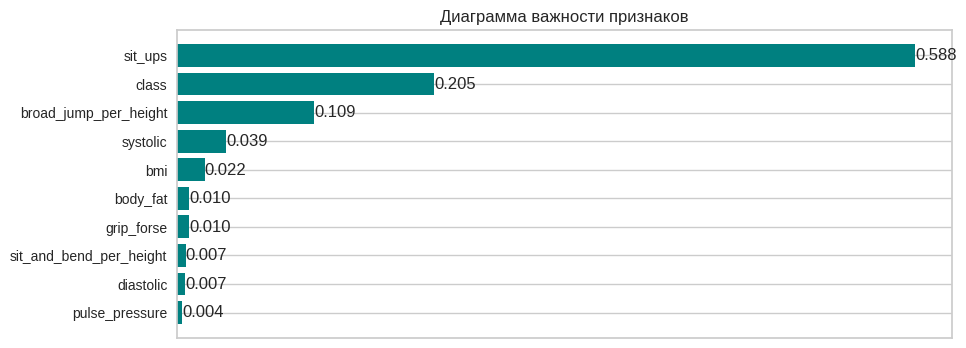

In [ ]:
# Посмотрю важность признаков.
my_features_importance(gbr, X_train_new)

У модели градиентный бустинг из библиотеки Scikit-learn три самых важных признака такие же, как и у других моделей: количество приседаний (0.588), уровень здоровья (0.205) и длина прыжка с места (0.109). Наименее важный признак - пульсовое давление (0.004).

In [ ]:
# Определю необходимость признаков для обучения модели.
column_gbr = my_rfecv(gbr, X_train_new)

RFECV(cv=5, estimator=GradientBoostingRegressor(random_state=20))


Optimal number of features : 10


array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True])

Для обучения модели градиентный бустинг нужны все признаки.

In [ ]:
print('Модели для обучения нужны признаки:')
column_gbr = list(X_train_new.loc[:,column_gbr].columns)
column_gbr

Модели для обучения нужны признаки:


['body_fat',
 'diastolic',
 'systolic',
 'grip_forse',
 'sit_ups',
 'class',
 'bmi',
 'broad_jump_per_height',
 'sit_and_bend_per_height',
 'pulse_pressure']

In [ ]:
# Снова создам модель градиентный бустинг.
gbr = GradientBoostingRegressor(random_state=20)
# Обучу ее на тренировочной выборке без подбора гиперпараметров.
gbr.fit(X_train_new[column_gbr], y_train_new)

GradientBoostingRegressor(random_state=20)

In [ ]:
# Сделаю предсказание на тренировочных данных.
gbr_predicted_train = gbr.predict(X_train_new[column_gbr])
r2, mae = metrics(y_train_new, gbr_predicted_train, 'тренировочной')
r2train.append(r2)
maetrain.append(mae)

На тренировочной выборке
R² = 0.646
MAE = 6.23


На тренировочной выборке модель показала значения: коэффициент детерминации 0.646 и средняя абсолютная ошибка 6.23 года.

In [ ]:
# Построю прогноз физиологического возраста на тестовых данных и выведу значения метрик.
gbr_predicted_test = gbr.predict(X_test_new[column_gbr])
r2, mae = metrics(y_test_new, gbr_predicted_test, 'тестовой')
r2test.append(r2)
maetest.append(mae)

На тестовой выборке
R² = 0.617
MAE = 6.592


На тестовой выборке результат несколько хуже ($R^2$=0.617 MAE=6.569 года). Возможно, модель недообучилась.

#### <b>Градиентный бустинг XGBoost</b>

In [ ]:
model.append('XGBoost')

In [ ]:
# Создам модель и обучу ее на тренировочной выборке.
xgb = XGBRegressor(random_state=20)
xgb.fit(X_train_new, y_train_new)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=20, ...)

,Features,Importance
body_fat,body_fat,0.019249
diastolic,diastolic,0.022642
sit_and_bend_per_height,sit_and_bend_per_height,0.026064
grip_forse,grip_forse,0.026970
pulse_pressure,pulse_pressure,0.031493
bmi,bmi,0.034680
systolic,systolic,0.039943
broad_jump_per_height,broad_jump_per_height,0.064537
class,class,0.262394
sit_ups,sit_ups,0.472028


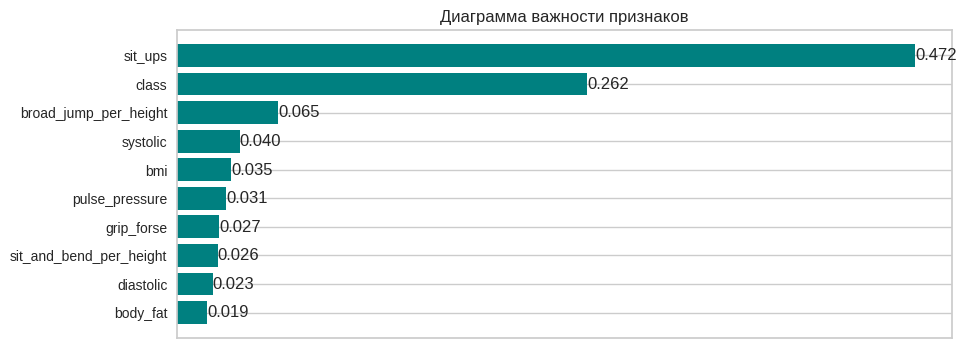

In [ ]:
# Посмотрю важность признаков.
my_features_importance(xgb, X_train_new)

У модели экстремальный градиентный бустинг первые три по важности признака совпадают с предыдущими моделями. Самый важный признак это количество приседаний (0.472). На втором месте уровень здоровья (0.262). На третьем с заметным отставанием - длина прыжка (0.065). Самый слабый признак - степень ожирения (0.019).

In [ ]:
# Определю необходимость признаков для обучения модели.
column_xgb = my_rfecv(xgb, X_train_new)

RFECV(cv=5,
      estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
                             colsample_bylevel=None, colsample_bynode=None,
                             colsample_bytree=None, early_stopping_rounds=None,
                             enable_categorical=False, eval_metric=None,
                             feature_types=None, gamma=None, gpu_id=None,
                             grow_policy=None, importance_type=None,
                             interaction_constraints=None, learning_rate=None,
                             max_bin=None, max_cat_threshold=None,
                             max_cat_to_onehot=None, max_delta_step=None,
                             max_depth=None, max_leaves=None,
                             min_child_weight=None, missing=nan,
                             monotone_constraints=None, n_estimators=100,
                             n_jobs=None, num_parallel_tree=None,
                             predictor=None, random_state=20, ...))


Optimal number of features : 8


array([False, False,  True,  True,  True,  True,  True,  True,  True,
        True])

Модели для обучения нужно 8 признаков.

In [ ]:
print('Модели для обучения нужны признаки:')
column_xgb = list(X_train_new.loc[:,column_xgb].columns)
column_xgb

Модели для обучения нужны признаки:


['systolic',
 'grip_forse',
 'sit_ups',
 'class',
 'bmi',
 'broad_jump_per_height',
 'sit_and_bend_per_height',
 'pulse_pressure']

Исключили признаки диастолическое артериальное давление и степень ожирения.

In [ ]:
# Создам модель и обучу ее на тренировочной выборке.
xgb = XGBRegressor(random_state=20)
xgb.fit(X_train_new[column_xgb], y_train_new)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=20, ...)

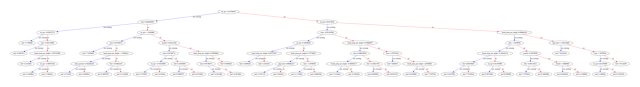

In [ ]:
# Выведу структуру дерева на нулевой итерации.
from xgboost import plot_tree
plot_tree(xgb, num_trees=0)
plt.rcParams['figure.figsize'] = [150, 150]
plt.show()

Модель XGBoost на первой итерации первую проверку делает по признаку количество приседаний.

In [ ]:
# Сделаю предсказание на тренировочных данных.
xgb_predicted_train = xgb.predict(X_train_new[column_xgb])
r2, mae = metrics(y_train_new, xgb_predicted_train, 'тренировочной')
r2train.append(r2)
maetrain.append(mae)

На тренировочной выборке
R² = 0.843
MAE = 3.999


Модель экстремальный градиентный на тренировочной выборке показара значение коэффициента детерминации $R^2$=0.843, среднюю абсолютную ошибку MAE=3.999 года.

In [ ]:
# Построю прогноз физиологического возраста на тестовых данных и выведу значения метрик.
xgb_predicted_test = xgb.predict(X_test_new[column_xgb])
r2, mae = metrics(y_test_new, xgb_predicted_test, 'тестовой')
r2test.append(r2)
maetest.append(mae)

На тестовой выборке
R² = 0.587
MAE = 6.666


На тестовой выборке значение метрик хуже и составляет $R^2$=0.587, MAE=6.666 год. Большой разрыв между значениями метрик на тренировочной и тестовой выборках говорит о переобучении.

#### <b>Градиентный бустинг LightGBM</b>

In [ ]:
model.append('LightGBM')

Градиентный бустинг работает с категориальными признаками, преобразованными в целые неотрицательные значения. Поэтому я верну исходный признак class с типом category до нормализации.

In [ ]:
# Верну прежний вид категориального признака class.
X_train_cat = X_train_new.drop('class', axis=1)
X_train_cat = X_train_cat.merge(data['class'], how='left', left_index=True, right_index=True, suffixes=None)

In [ ]:
X_test_cat = X_test_new.drop('class', axis=1)
X_test_cat = X_test_cat.merge(data['class'], how='left', left_index=True, right_index=True, suffixes=None)

In [ ]:
X_train_cat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10609 entries, 4755 to 13189
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   body_fat                 10609 non-null  float64 
 1   diastolic                10609 non-null  float64 
 2   systolic                 10609 non-null  float64 
 3   grip_forse               10609 non-null  float64 
 4   sit_ups                  10609 non-null  float64 
 5   bmi                      10609 non-null  float64 
 6   broad_jump_per_height    10609 non-null  float64 
 7   sit_and_bend_per_height  10609 non-null  float64 
 8   pulse_pressure           10609 non-null  float64 
 9   class                    10609 non-null  category
dtypes: category(1), float64(9)
memory usage: 1.1 MB


In [ ]:
X_train_cat.head()

,body_fat,diastolic,systolic,grip_forse,sit_ups,bmi,broad_jump_per_height,sit_and_bend_per_height,pulse_pressure,class
4755,1.477790,0.906625,0.568889,-0.557983,-2.283755,0.426151,-0.061745,1.478873,-0.128136,4
2810,-0.149816,0.810716,0.018295,-2.822396,-0.002342,-0.174604,-0.408601,0.120160,-0.773654,2
4742,-1.231444,1.392789,0.166724,-0.958234,-0.430931,-0.584567,-0.456631,-0.659898,-1.154188,4
6824,-1.096240,0.034618,0.537797,0.934172,0.426247,-0.550759,0.215006,1.016123,0.653346,1
9938,0.002288,-0.062394,-0.278564,0.086826,-0.602367,0.559788,-1.030479,-0.649487,-0.297988,3


Прежний категориальный признак class с типом category возвращен.

In [ ]:
# Создам модель и обучу ее на тренировочной выборке.
lgbm = LGBMRegressor(random_state=20)
lgbm.fit(X_train_cat, y_train_new, categorical_feature=['class'])

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1813
[LightGBM] [Info] Number of data points in the train set: 10609, number of used features: 10
[LightGBM] [Info] Start training from score 36.510793


LGBMRegressor(random_state=20)

,Features,Importance
class,class,0.168
diastolic,diastolic,0.233
pulse_pressure,pulse_pressure,0.243
sit_and_bend_per_height,sit_and_bend_per_height,0.282
systolic,systolic,0.287
bmi,bmi,0.318
grip_forse,grip_forse,0.323
body_fat,body_fat,0.331
sit_ups,sit_ups,0.405
broad_jump_per_height,broad_jump_per_height,0.410


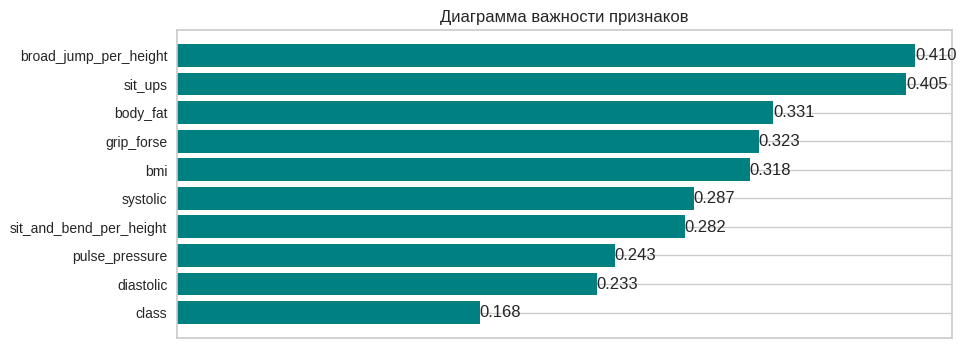

In [ ]:
# Посмотрю важность признаков.
my_features_importance(lgbm, X_train_cat, 1000)

У модели LightGBM в отличие от других моделей самым важным признаком является длина прыжка вперед (0.410). А уже на втором месте - количество приседаний (0.405).Третьим по важности признаком стала степень ожирения (0.331), а уровень здоровья скатился на последнее место (0.168).

In [ ]:
# Определю необходимость признаков для обучения модели.
column_lgbm = my_rfecv(lgbm, X_train_cat)

RFECV(cv=5, estimator=LGBMRegressor(random_state=20))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1804
[LightGBM] [Info] Number of data points in the train set: 8487, number of used features: 10
[LightGBM] [Info] Start training from score 36.433251
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1799
[LightGBM] [Info] Number of data points in the train set: 8487, number of used features: 9
[LightGBM] [Info] Start training from score 36.433251
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1666
[LightGBM] [Info] Number of data points in the train set: 8487, number of used features: 8
[LightGBM] [Info] St

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True])

Модели для обучения нужны все признаки.

In [ ]:
print('Модели для обучения нужны признаки:')
column_lgbm = list(X_train_new.loc[:,column_lgbm].columns)
column_lgbm

Модели для обучения нужны признаки:


['body_fat',
 'diastolic',
 'systolic',
 'grip_forse',
 'sit_ups',
 'class',
 'bmi',
 'broad_jump_per_height',
 'sit_and_bend_per_height',
 'pulse_pressure']

In [ ]:
# Снова создам модель и обучу ее на тренировочной выборке.
lgbm = LGBMRegressor(random_state=20)
lgbm.fit(X_train_cat[column_lgbm], y_train_new, categorical_feature=['class'])

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1813
[LightGBM] [Info] Number of data points in the train set: 10609, number of used features: 10
[LightGBM] [Info] Start training from score 36.510793


LGBMRegressor(random_state=20)

In [ ]:
# Сделаю предсказание на тренировочных данных.
lgbm_predicted_train = lgbm.predict(X_train_cat[column_lgbm])
r2, mae = metrics(y_train_new, lgbm_predicted_train, 'тренировочной')
r2train.append(r2)
maetrain.append(mae)

На тренировочной выборке
R² = 0.742
MAE = 5.241


На тренировочной выборке модель LightGBM показала значение коэффициента детерминации $R^2$=0.742, а среднюю абсолютную ошибку MAE=5.241 год.

In [ ]:
# Построю прогноз физиологического возраста на тестовых данных и выведу значения метрик.
lgbm_predicted_test = lgbm.predict(X_test_cat[column_lgbm])
r2, mae = metrics(y_test_new, lgbm_predicted_test, 'тестовой')
r2test.append(r2)
maetest.append(mae)

На тестовой выборке
R² = 0.618
MAE = 6.423


На тестовой выборке значения метрик составили $R^2$=0.618, MAE=6.423 года.

#### <b>Градиентный бустинг CatBoost</b>

In [ ]:
model.append('CatBoost')

In [ ]:
# Определю индекс категориального столбца.
cat_features_index = [X_train_cat.columns.to_list().index('class')]
cat_features_index

[9]

In [ ]:
# Создам модель.
cb = CatBoostRegressor(random_state=20, verbose=200)
# Обучу ее на тренировочной выборке без подбора гиперпараметров.
cb.fit(X_train_cat, y_train_new, cat_features= cat_features_index, verbose=200)

Learning rate set to 0.059462
0:	learn: 13.1356906	total: 52.7ms	remaining: 52.6s
200:	learn: 8.0223134	total: 939ms	remaining: 3.73s
400:	learn: 7.5574440	total: 1.82s	remaining: 2.73s
600:	learn: 7.1861643	total: 2.7s	remaining: 1.79s
800:	learn: 6.9134058	total: 3.58s	remaining: 889ms
999:	learn: 6.6625161	total: 4.47s	remaining: 0us


,Features,Importance
diastolic,diastolic,0.039300
pulse_pressure,pulse_pressure,0.043350
body_fat,body_fat,0.055125
grip_forse,grip_forse,0.056800
bmi,bmi,0.058852
systolic,systolic,0.063922
sit_and_bend_per_height,sit_and_bend_per_height,0.064444
broad_jump_per_height,broad_jump_per_height,0.142868
class,class,0.159775
sit_ups,sit_ups,0.315565


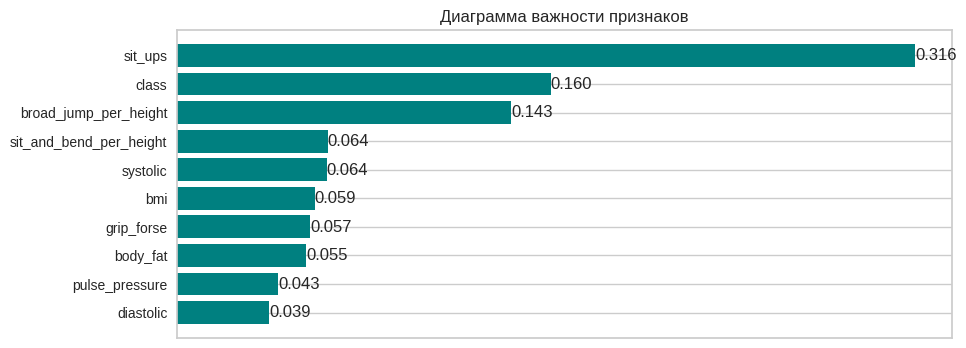

In [ ]:
# Посмотрю важность признаков.
my_features_importance(cb, X_train_cat, 100)

Модель CatBoost, следуя традициям, считает самым важным признаком количество приседаний (0.316). На втором месте уровень здоровья (0.160). А на третьем - длина прыжка (0.143). Самый слабый признак - диастолическое (нижнее) давление (0.039).

In [ ]:
# Определю необходимость признаков для обучения модели.
column_cb = my_rfecv(cb, X_train_cat)

RFECV(cv=5,
      estimator=<catboost.core.CatBoostRegressor object at 0x7d42394b1420>)


Learning rate set to 0.057401
0:	learn: 13.0761785	total: 6.13ms	remaining: 6.12s
200:	learn: 7.8190743	total: 451ms	remaining: 1.79s
400:	learn: 7.2952481	total: 887ms	remaining: 1.32s
600:	learn: 6.9132280	total: 1.33s	remaining: 883ms
800:	learn: 6.5693792	total: 1.76s	remaining: 436ms
999:	learn: 6.2855077	total: 2.19s	remaining: 0us
Learning rate set to 0.057401
0:	learn: 13.0650843	total: 2.25ms	remaining: 2.25s
200:	learn: 7.8425995	total: 416ms	remaining: 1.66s
400:	learn: 7.3348239	total: 830ms	remaining: 1.24s
600:	learn: 6.9467085	total: 1.23s	remaining: 820ms
800:	learn: 6.6091155	total: 1.71s	remaining: 424ms
999:	learn: 6.3202618	total: 2.82s	remaining: 0us
Learning rate set to 0.057401
0:	learn: 13.0700740	total: 4.42ms	remaining: 4.42s
200:	learn: 7.8901395	total: 1.07s	remaining: 4.27s
400:	learn: 7.3914927	total: 2.16s	remaining: 3.23s
600:	learn: 7.0392244	total: 3.23s	remaining: 2.14s
800:	learn: 6.7215812	total: 3.74s	remaining: 930ms
999:	learn: 6.4440414	total: 

array([ True, False,  True,  True,  True,  True,  True,  True,  True,
        True])

Модели для обучения нужно 9 признаков.

In [ ]:
print('Модели для обучения нужны признаки:')
column_cb = list(X_train_new.loc[:,column_cb].columns)
column_cb

Модели для обучения нужны признаки:


['body_fat',
 'systolic',
 'grip_forse',
 'sit_ups',
 'class',
 'bmi',
 'broad_jump_per_height',
 'sit_and_bend_per_height',
 'pulse_pressure']

Исключили диастолическое артериальное давление.

In [ ]:
# Снова определю индекс категориального столбца.
cat_features_index = [X_train_cat[column_cb].columns.to_list().index('class')]
cat_features_index

[4]

In [ ]:
# Создам модель.
cb = CatBoostRegressor(random_state=20, verbose=200)
# Обучу ее на тренировочной выборке без подбора гиперпараметров.
cb.fit(X_train_cat[column_cb], y_train_new, cat_features= cat_features_index, verbose=200)

Learning rate set to 0.059462
0:	learn: 13.1447526	total: 5.19ms	remaining: 5.18s
200:	learn: 8.0492845	total: 921ms	remaining: 3.66s
400:	learn: 7.5487633	total: 1.81s	remaining: 2.7s
600:	learn: 7.2190897	total: 2.72s	remaining: 1.8s
800:	learn: 6.9405203	total: 3.6s	remaining: 895ms
999:	learn: 6.6917770	total: 4.47s	remaining: 0us


In [ ]:
# Сделаю предсказание на тренировочных данных.
cb_predicted_train = cb.predict(X_train_cat[column_cb])
r2, mae = metrics(y_train_new, cb_predicted_train, 'тренировочной')
r2train.append(r2)
maetrain.append(mae)

На тренировочной выборке
R² = 0.75
MAE = 5.171


Модель CatBoost на тренировочной выборке показала значение коэффициента детерминации $R^2$=0.75 и среднюю абсолютную ошибку MAE=5.171 года.

In [ ]:
# Построю прогноз физиологического возраста на тестовых данных и выведу значения метрик.
cb_predicted_test = cb.predict(X_test_cat[column_cb])
r2, mae = metrics(y_test_new, cb_predicted_test, 'тестовой')
r2test.append(r2)
maetest.append(mae)

На тестовой выборке
R² = 0.618
MAE = 6.487


На тестовых данных модель CatBoost показала значения метрик $R^2$=0.618 и MAE=6.487 года.

#### <b>Анализ результатов и выводы.</b>

In [ ]:
# Создам датафрейм со значениями коэффициента детерминации моделей на тренировочной и тестовой выборках.
df_r2 = pd.DataFrame({'Модель':model, 'R2 train':r2train, 'R2 test':r2test})
df_r2

,Модель,R2 train,R2 test
0,Линейная регрессия,0.514,0.512
1,Стохастический градиентный спуск,0.511,0.510
2,Дерево решений,1.000,0.238
3,Случайный лес,0.946,0.609
4,Градиентный бустинг,0.646,0.617
5,XGBoost,0.843,0.587
6,LightGBM,0.742,0.618
7,CatBoost,0.750,0.618


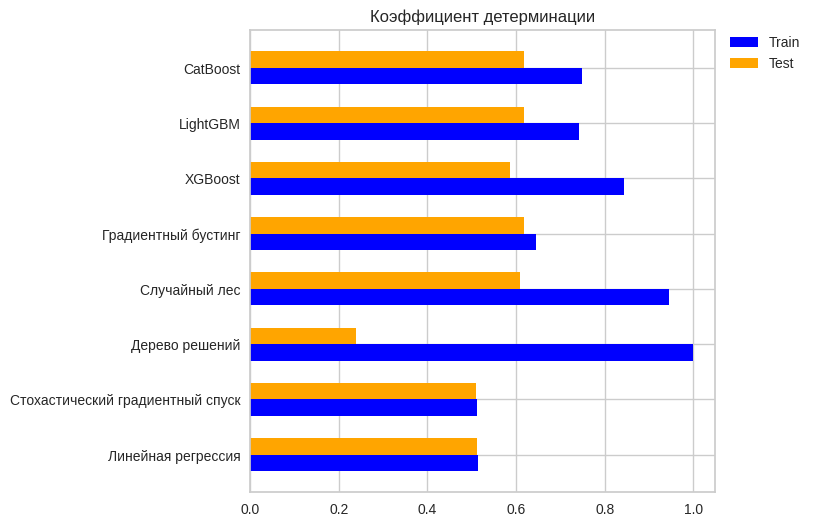

In [ ]:
# Построю диаграмму метрик для разных моделей.
width = 0.3
x = np.arange(len(model))
fig, ax = plt.subplots(figsize=(6,6))
rects1 = ax.barh(x - width/2, r2train, width, label='Train', color='blue')
rects2 = ax.barh(x + width/2, r2test, width, label='Test', color='orange')
ax.set_title('Коэффициент детерминации')
ax.set_yticks(x)
ax.set_yticklabels(model)
ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad= 0);

In [ ]:
# Создам датафрейм со значениями средней абсолютной ошибки моделей на тренировочной и тестовой выборках.
df_mae = pd.DataFrame({'Модель':model, 'MAE train':maetrain, 'MAE test':maetest})
df_mae

,Модель,MAE train,MAE test
0,Линейная регрессия,7.609,7.739
1,Стохастический градиентный спуск,7.654,7.799
2,Дерево решений,0.000,8.619
3,Случайный лес,2.366,6.526
4,Градиентный бустинг,6.230,6.592
5,XGBoost,3.999,6.666
6,LightGBM,5.241,6.423
7,CatBoost,5.171,6.487


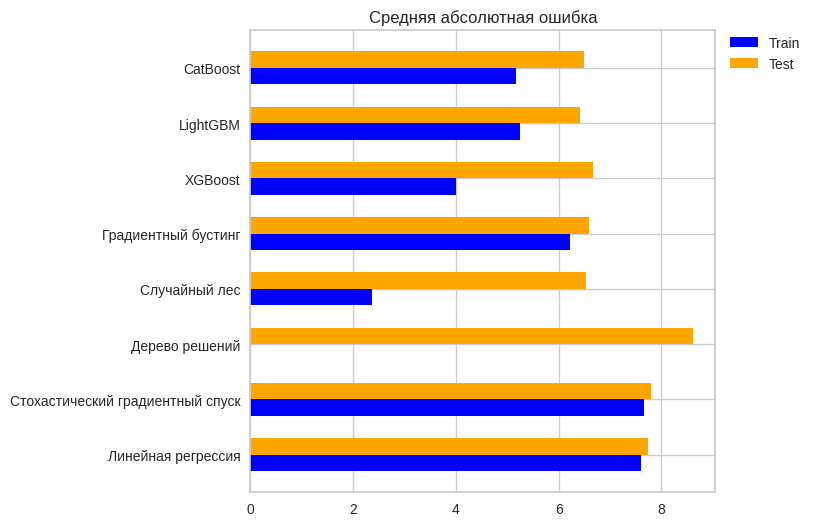

In [ ]:
# Построю диаграмму метрик для разных моделей.
width = 0.3
x = np.arange(len(model))
fig, ax = plt.subplots(figsize=(6,6))
rects1 = ax.barh(x - width/2, maetrain, width, label='Train', color='blue')
rects2 = ax.barh(x + width/2, maetest, width, label='Test', color='orange')
ax.set_title('Средняя абсолютная ошибка')
ax.set_yticks(x)
ax.set_yticklabels(model)
ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad= 0);

<b>Выводы</b>

Для решения поставленной задачи были выбраны модели:
- линейная регрессия,
- стохастический градиентный спуск,
- дерево решений,
- случайный лес,
- градиентный бустинг sklearn,
- градиентный бустинг XGBoost,
- градиентный бустинг LightBoost,
- градиентный бустинг CatBoost.

Начальные установки:

- Обучение моделей производилось на подготовленных данных, поделенных неа тренировочную и тестовую выборки в соотношении 80:20.
- Подбор гиперпараметров не производился (использовались значения, установленные по умолчанию).
- В случае обнаружения признаков, в которых не было необходимости для обучения модели, этот признак исключался из рассмотрения.
- Оценка качества работы моделей производилась на тестовой выборке. Для оценки качества работы моделей использовались коэффициент детерминации $R^2$ и средняя абсолютная ошибка MAE. При оценивании качества модели кросс-валидация не использовалась.

Результаты:

- Модели линейная регрессия, стохастический градиентный спуск и градиентный бустинг sklearn показали неудовлетворительные значения метрик как на тренировочной, так и на тестовой выборках, что говорит о недообученности моделей.
- Модели дерево решений, случайный лес и градиентный бустинг XGBoost переобучились и показали на тестовой выборке значения метрик значительно хуже, чем на тренировочной. Дерево решений получилось глубиной 32 и с 8336 листьями. Такое дерево показало значение $R^2$=1.0 и среднюю абсолютную ошибку MAE=0. То есть точно предсказала результат на данных, на которых обучалась и сильно ошиблась на неизвестных данных ($R^2$=0.238 и MAE=8.619 лет).
- Модели градиентных бустингов LightGBM и CatBoost судя по всему нормально обучились и показали на тестовых данных значение метрик несколько ниже, чем на тренировочных. Лучшее значение метрик оказалось у модели LightGBM: коэффициент детерминации $R^2$=0.618 и средняя абсолютная ошибка MAE=6.423 года. Но даже эти значения далеки от идеала - ошибка в предсказании физиологического возраста 6.4 года при медианном возрасте 32 года очень велика.

<b>Ни одна из использованных моделей без подбора гиперпараметров не смогла предсказать на предоставленных данных значение физиологического возраста с необходимой точностью. При подборе гиперпараметров моделей качество моделей может измениться в лучшую сторону.</b>

Нормой считается отклонение физиологическогог возраста от хронологического не более чем на 5 лет. В этом случае старение рассматривается как естественное.

В случае недостаточного увеличения точности моделей после подбора гиперпараметров можно будет сделать вывод о нерепрезентативности выборки (в данных присутствует много людей с потенциальными проблемами со здоровьем, увеличивающими разрыв между физиологическим и хронологическим возрастами), а также недостаточностью признаков, влияющих на физиологический возраст, например наличие вредных привычек и семейное положение.

### <b>PyCaret</b>

Воспользуюсь фреймворком автоматического машинного обучения PyCaret для контрольной проверки результатов обучения моделей. Для AutoML буду использовать неподготовленные данные.

In [ ]:
# Загружаю исходные данные из файла в новый датафрейм.
try:
    data_pc = pd.read_csv('C:/users/Обучение/Documents/FinUniver/bodyPerformance.csv')
except:
    from google.colab import drive
    drive.mount('/content/drive')
    data_pc = pd.read_csv('/content/drive/MyDrive/Finance University/Modul 2/bodyPerformance.csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Сделаю исследовательский анализ дпнных с помощью pandas_profiling.
pandas_profiling.ProfileReport(data_pc)

Output hidden; open in https://colab.research.google.com to view.

В датасете 12 столбцов и 13393 строки. Пропусков в данных нет. Есть одна строка - дубликат. Ряд признаков имеет сильную взаимную корреляцию. Например, рост сильно коррелирует с гендерным признаком, весом, степенью ожирения, силой жима и длиной прыжка, а диастолическое артериальное давление сильно коррелирует с систолическим давлением. Данные равномерно распределены по признаку экспертная оценка уровня здоровья.

In [ ]:
# Обнаружена одна строка дубликат. Удалю ее.
data_pc = data_pc.drop_duplicates()
data_pc.duplicated().sum()

0

Дубликаты удалены.

In [ ]:
# Посмотрю статистические характеристики набора данных.
data_pc.describe()

,age,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm
count,13392.000000,13392.000000,13392.000000,13392.000000,13392.000000,13392.000000,13392.000000,13392.000000,13392.000000,13392.000000
mean,36.775836,168.560671,67.448686,23.239608,78.797499,130.238120,36.964569,15.208933,39.770385,190.131355
std,13.625886,8.426305,11.949061,7.256829,10.742165,14.709536,10.624959,8.456904,14.276902,39.868988
min,21.000000,125.000000,26.300000,3.000000,0.000000,0.000000,0.000000,-25.000000,0.000000,0.000000
25%,25.000000,162.400000,58.200000,18.000000,71.000000,120.000000,27.500000,10.900000,30.000000,162.000000
50%,32.000000,169.200000,67.400000,22.800000,79.000000,130.000000,37.900000,16.200000,41.000000,193.000000
75%,48.000000,174.800000,75.300000,28.000000,86.000000,141.000000,45.200000,20.700000,50.000000,221.000000
max,64.000000,193.800000,138.100000,78.400000,156.200000,201.000000,70.500000,213.000000,80.000000,303.000000


In [ ]:
# Выделю из датафрейма целевой признак.
y_pc = data_pc['age']
X_pc = data_pc.drop('age', axis=1)
# Разделю данные на тренировочную и тестовую выборки.
X_pc_train, X_pc_test, y_pc_train, y_pc_test = train_test_split(X_pc, y_pc, test_size=0.2, shuffle=True, random_state=20)

In [ ]:
# Посмотрю статистические характеристики тренировочной выборки.
X_pc_train.describe()

,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm
count,10713.000000,10713.000000,10713.000000,10713.000000,10713.000000,10713.000000,10713.000000,10713.000000,10713.000000
mean,168.522151,67.360861,23.217775,78.789592,130.177728,36.927120,15.246760,39.785681,190.130122
std,8.397424,11.866168,7.224392,10.695260,14.718105,10.621677,8.520768,14.271026,39.773367
min,125.000000,33.700000,3.000000,0.000000,0.000000,0.000000,-25.000000,0.000000,0.000000
25%,162.400000,58.100000,18.000000,71.000000,120.000000,27.500000,10.900000,30.000000,162.000000
50%,169.200000,67.400000,22.800000,79.000000,130.000000,37.900000,16.300000,41.000000,193.000000
75%,174.700000,75.260000,28.000000,86.000000,141.000000,45.100000,20.700000,50.000000,221.000000
max,193.800000,138.100000,54.900000,156.200000,201.000000,70.500000,213.000000,80.000000,303.000000


Значения медианы, среднего значения и стандартного отклонения в тренировочной выборке практически не отличаются от аналогичных значений в исходных данных.

In [ ]:
# Возвращу целевой признак age в тренировочную и тестовую выборки.
X_pc_train['age'] = y_pc_train
X_pc_test['age'] = y_pc_test
X_pc_train.shape, X_pc_test.shape


((10713, 12), (2679, 12))

Необработанные данные разделены на тренировочную и тестовую выборки без выделения целевого признака.

In [ ]:
# Создам  модуль с набором моделей.
pc = RegressionExperiment()
pc.setup(data=X_pc_train, target='age', session_id = 123)

,Description,Value
0,Session id,123
1,Target,age
2,Target type,Regression
3,Original data shape,"(10713, 12)"
4,Transformed data shape,"(10713, 15)"
5,Transformed train set shape,"(7499, 15)"
6,Transformed test set shape,"(3214, 15)"
7,Ordinal features,1
8,Numeric features,9
9,Categorical features,2


In [ ]:
# Обучу набор моделей на тренировочной выборке.
best = pc.compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,6.1691,65.5228,8.0931,0.6473,0.2213,0.1843,0.4760
catboost,CatBoost Regressor,6.2802,66.5939,8.1588,0.6414,0.2243,0.1880,2.9550
et,Extra Trees Regressor,6.2916,67.5707,8.2170,0.6361,0.2259,0.1906,1.3860
rf,Random Forest Regressor,6.4273,69.3662,8.3258,0.6265,0.2288,0.1946,3.5640
gbr,Gradient Boosting Regressor,6.7027,72.2387,8.4965,0.6111,0.2333,0.2020,0.8580
xgboost,Extreme Gradient Boosting,6.5233,73.5579,8.5734,0.6040,0.2352,0.1949,0.6260
ridge,Ridge Regression,7.3725,83.7683,9.1513,0.5488,0.2609,0.2257,0.0670
lar,Least Angle Regression,7.3721,83.7681,9.1513,0.5488,0.2610,0.2257,0.0710
br,Bayesian Ridge,7.3735,83.7701,9.1514,0.5488,0.2608,0.2257,0.0690
lr,Linear Regression,7.3721,83.7681,9.1513,0.5488,0.2610,0.2257,0.5450


Processing:   0%|          | 0/85 [00:00<?, ?it/s]

Самый лучший результат показала модель градиентный бустинг LightGBM. На тренировочной выборке коэффициент детерминации$R^2$=0.6473, а средняя абсолютная ошибка MAE=6.1691 год. PyCaret подтвердил мой выбор модели. Но значение метрик невелико уже на тренировочной выборке (после подготовки данных к машинному обучению LightGBM на тренировочной выборке показал $R^2$=0.742 и MAE=5.241 год, возможно различие связано с тем, что PyCaret вычисляет значения метрик с использованием кросс-валидации).

In [ ]:
# Выведу лучшую модель.
print(best)

LGBMRegressor(n_jobs=-1, random_state=123)


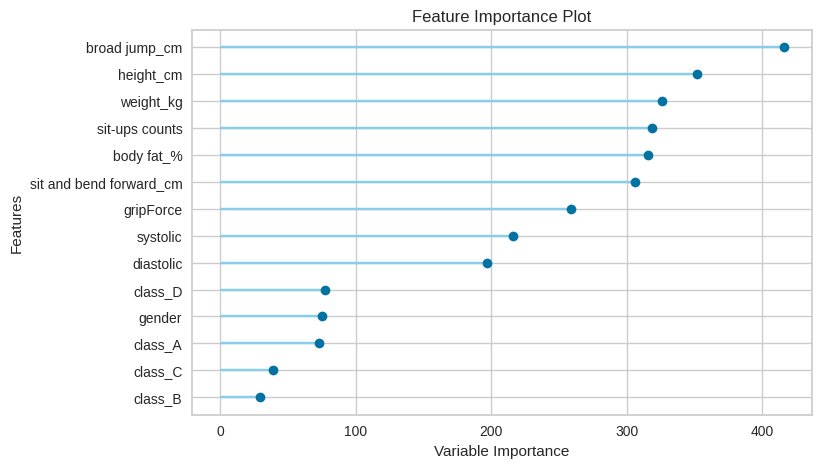

In [ ]:
# Посмотрю ее характеристики.
pc.evaluate_model(best)

Самым важным признаком для модели LightGBM из фреймворка PyCaret оказалась длина прыжка. На втором месте рост. Затем вес, количество приседаний, степень ожирения и глубина наклона вперед. Наименее важными признаками оказались гендерный признак и уровень здоровья.

In [ ]:
# Сделаю предсказание выбранной модели на тестовой выборке и выведу первые пять значений.
predictions = pc.predict_model(best, data=X_pc_test)
predictions.head()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,6.0797,63.9598,7.9975,0.6543,0.2203,0.1830


,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class,age,prediction_label
13253,F,167.000000,57.000000,21.799999,72.0,102.0,28.299999,6.500000,27.0,171.0,D,46.0,28.143185
8129,F,156.899994,63.900002,22.900000,96.0,153.0,20.299999,21.200001,6.0,116.0,D,46.0,59.110643
3909,F,157.399994,56.799999,24.600000,63.0,101.0,26.700001,22.700001,54.0,175.0,A,25.0,28.290012
12753,F,168.699997,62.000000,30.100000,79.0,134.0,29.400000,22.100000,40.0,188.0,A,21.0,25.405683
8419,F,159.100006,48.900002,27.400000,64.0,114.0,22.299999,19.100000,50.0,172.0,B,22.0,25.078617


На тестовой выборке выбранная модель LightGBM показала значение коэффициента детерминации $R^2$=0.6543 и среднюю абсолютную ошибку MAE=6.0797. Эти значения лучше, чем на тренировочной выборке. Скорее всего это просто случайность, которую можно объяснить удачным подбором данных в тестовой выборке.

### Выводы

<b>Передо мной стояла задача построить модель машинного обучения, позволяющую на основании предоставленных данных определять физиологический возраст с достаточной точностью.</b>

Нормой отклонения физиологическогог возраста от хронологического считается величина не более 5 лет. В этом случае старение рассматривается как естественное. Поэтому достаточной точностью предсказания моделью физиологического возраста на тестовых данных буду считать значение средней абсолютной ошибки менее 5 лет.

1. <b>Разведочный анализ данных</b>

Предоставленные данные состояли из 12 столбцов и 13393 строк. В выборке участвовали мужчины и женщины с разным состоянием здоровья и физического развития от 21 до 64 лет. Распределение людей в выборке по уровням состояния здоровья равномерное, мужчин 63.2%, женщин 36.8%.

Исходные данные содержали два категориальных признака: гендерный признак (gender) и экспертная оценка уровня здоровья (class). И 10 количественных признаков: возраст (age), рост (height), вес (weight), степень ожирения (body_fat), диастолическое (diastolic) и систолическое (systolic) артериальное давление, сила жима кисти (grip_forse), количество приседаний за 2 минуты (sit_ups), длина прыжка с места (broad_jump), глубина наклона вперед в положении сидя (sit_and_bend_forward). Категориальные столбцы имели тип object, количественные - float.

Пропусков в данных не было. Была обнаружена одна строка дубликат.

<b>*В результате подготовки данных было сделано:*</b>
- Названия столбцов были приведены к унифицированному виду.
- Категориальные столбцы были приведены к типу category (столбец class - с учетом порядка).
- Количественные столцы age (возраст), количество приседаний (sit_ups), длина прыжка с места (broad_jump), diastolic (нижнее артериальное давление) и systolic (верхнее артериальное давление) преобразованы к целочисленному типу int.
- Были созданы дополнительные признаки:
1. Пульсовое артериальное давление (pulse_pressure) как разность между верхним и нижним артериальными давлениями.
2. Индекс массы тела (bmi) на основании данных о росте и весе. Рост (height) и вес (weight) были удалены, как не имещие влияния на физиологический возраст.
- Признаки длина прыжка (broad_jump) и глубина наклона (sit_and_bend_forward) были номированы к росту участника.
- Были обнаружены и исправлены ошибки в данных:
1. В ряде строк систолическое давление оказалось ниже, чем диастолическое.  Исправлено взаимной заменой значений.
2. Недостоверно низкие значения пулсового давления (ниже 10 мм рт.ст.) и диастолического давления (меньше 30 мм рт.ст.), при том, что человек может приседать и прыгать, были заменены медианными значениями.
3. Аномальные значения степени ожирения, несоответствующие индексу массы тела, также были заменены медианными значениями.
4. Аномальные значения глубины наклона (значение глубины наклона больше роста) были заменены на медианные значения.
5. Люди, отказавшиеся (имеющие нулевые значения) измерять силу жима, выполнять приседания и прыжки с места, были удалены из выборки.
6. Аномальные значения силы жима менее 5.3 кг были заменены на медианные.

Распределения значений по всем измеряемым параметрам у мужчин и у женщин, кроме экспертной оценки уровня здоровья, очень сильно различались, поэтому я принял решение рассматривать все параметры отдельно для мужчин и для женщин.
- Почти половина женщин и больше половины мужчин имеют пульсовое давление выше 50 мм рт.ст. и находятся в группе риска по сердечно-сосудистым заболеваниям.
- Медианное артериальное диастолическое (нижнее) артериальное давление у мужчин 81 мм рт.ст, у женщин - 75 мм рт.ст. В распределении диастолического давления наблюдается максимум на отметке 80 мм рт.ст. и у мужчин, и у женщин.  Это округленное измерение диастолического давления у здорового человека.
- Медианное значение систолического (верхнего) артериального давления у женщин (123 мм рт.ст.) очень близко к медицинскому стандарту 120/80 мм рт.ст. и существенно ниже, чем у мужчин (134 мм рт.ст.). А систолическое давление выше 140 - признак артериальной гипертензии. Больше четверти мужчин в выборке имеют верхнее давление выше 140 мм рт.ст. Это может свидетельствовать или о нерепрезентативности выборки (значительная часть мужчин в выборке имеют проблемы с сердечно-сосудистой системой) или о некорректности проведения измерений давления (например, после нагрузки верхнее давление может значительно повышаться, а измерение давления должно производиться в состоянии покоя).

<b>*В результате можно сказать, что:*</b>
1. *Увеличение любого давления приводит к увеличению физиологического возраста.*
2. *Физиологический возраст женщин значительно сильнее зависит от увеличения пульсового и (или) верхнего (систолического) давления чем у мужчин.*
3. *Коэффициенты корреляции возраста от всех видов давления не превышают 0.3. Это значит, что давление не является определяющим фактором для определения физиологического возраста.*

- Распределение индекса массы тела у женщин смещено в область меньших значений относительно распределения у мужчин (медианное значение BMI у мужчин равно 24.29, у женщин - 21.74). При этом величина межквартильного размаха практически совпадает. Мужчины имеют более развитую мускулатуру, а соотвественно более высокий индекс массы тела.
- В организме человека присутствует незаменимый жир. Он требуется для поддержания жизнедеятельности и репродуктивных функций. 4-6% считаются физиологическим минимумом для мужчин. Женщинам требуется для нормальной жизнедеятельности по крайней мере на 9% больше. Распределение степени ожирения у женщин смещено в область больших значений относительно распределения у мужчин (медианное значение BF у мужчин равно 20.0%, у женщин - 28.3%).
- Мужчины в основной массе приседают больше женщин. Медианное значение количества приседаний за две минуты у мужчин - 46, у женщин - 32. Количество приседаний сильно влияет на физиологический возраст как у женщин, так и у мужчин. Уменьшение количества приседаний приводит к увеличению физиологического возраста.
- Распределение длины прыжка с места у мужчин смещено относительно распределения у женщин в сторону больших значений. Оба распределения имеют скос в сторону меньших значений.
- Измерение глубины наклона вперед в положении сидя (в йоге эта поза называется пашчимоттанасана) производится относительно положения ступней. В случае, когда удается дотянуться руками дальше положения ступней - значения положительные, в противном случае - отрицательные. Распределение у женщин смещено относительно распределения у мужчин в сторону положительных значений (медианное значение у женщин равно 0.128 роста, у мужчин 0.082 роста). То есть женщины более гибкие. Подавляющее большинство людей успешно дотягиваются дальше своих ступней. Но и у мужчин, и у женщин есть люди, не сумевшие это сделать.
- Распределения значений силы жима у мужчин и у женщин симметричные. Распределение силы жима кисти мужчин смещено относительно распределения силы жима женщин в сторону больших значений более чем на 15 кг.


<b>*Влияние показателей здоровья и результатов выполнения физических упражнений на физиологический возраст.*</b>
- Физиологический возраст зависит от всех признаков в датасете (Нулевых значений корреляции у признаков с целевым признаком нет).
- При этом нет признаков очень сильно влияющих на физиологический возраст. Самая большая отрицательная корреляция у физиологического возраста с количеством приседаний -0.5354 (Значение $\phi_K$=0.53). Это значит, что с увеличением возраста приседать людям становится труднее. Это утверждение похоже на правду для среднестатистического человека.
- Следующая, также отрицательная, величина корреляции Пирсона (-0.4164) между возрастом и нормированной длиной прыжка с места. Значение $\phi_K$=0.45. То есть с возрастом становится труднее далеко прыгнуть. Это утверждение также не вызывает отрицания.
- Остальные признаки имеют слабую корреляцию с физиологическим возрастом. Можно выделить корреляцию целевого признака со степенью ожирения 0.2281 ($\phi_K$=0.28), верхним 0.2141 ($\phi_K$=0.26) и нижним 0.1648 ($\phi_K$=0.20) давлением, силой жима кистью -0.1664 ($\phi_K$=0.31).
- Самое незначительное влияние на физиологический возраст оказывает глубина наклона в положении сидя 0.04254 ($\phi_K$=0.12).

<b>*Влияние показателей друг на друга.*</b>
- Сильнее всего взаимосвязаны длина прыжка и количество приседаний - коэффициент корреляции 0.7287 ($\phi_K$=0.71).
- На втором месте пульсовое и систолическое давление - коэффициент корреляции 0.6825 ($\phi_K$=0.56).
- На третьем месте связь между систолическим и диастолическим давлениями. Коэффициент корреляции 0.6822 ($\phi_K$=0.75).
- На четвертом месте длина прыжка и сила жима - коэффициент корреляции 0.6712 ($\phi_K$=0.65).
- На пятом месте длина прыжка и степень ожирения - коэффициент корреляции -0.6390 ($\phi_K$=0.64).


Люди, имеющие возможность далеко прыгнуть, физически развиты, а значит могут много раз присесть и имеют достаточную силу кисти. А чем выше степень ожирения, тем труднее прыгать.

<b>*Сильные различия в зависимости физиологического возраста от измеряемых параметров здоровья и физического развития у женщин и мужчин вынуждают решать задачу пргнозирования физиологического возраста раздельно.*</b>

2. <b>Подготовка данных к машинному обучению.</b>

- Данные были разделены на тренировочную и тестовую выборки в соотношении 80:20.
- Сильные различия в зависимости физиологического возраста от измеряемых параметров здоровья и физического развития вынуждали решать задачу прогнозирования раздельно для мужчин и для женщин. Чтобы избежать этого, распределения признаков были нормализованы раздельно для мужчин и для женщин, а затем данные были снова объеденины. Признак gender был удален.
- Данные подготовлены к машинному обучению.

3. <b>Построение моделей.</b>

Для решения поставленной задачи были выбраны модели:
- линейная регрессия,
- стохастический градиентный спуск,
- дерево решений,
- случайный лес,
- градиентный бустинг sklearn,
- градиентный бустинг XGBoost,
- градиентный бустинг LightBoost,
- градиентный бустинг CatBoost.

Начальные установки:

- Обучение моделей производилось на подготовленных данных, поделенных неа тренировочную и тестовую выборки в соотношении 80:20.
- Подбор гиперпараметров не производился (использовались значения, установленные по умолчанию).
- В случае обнаружения признаков, в которых не было необходимости для обучения модели, этот признак исключался из рассмотрения.
- Оценка качества работы моделей производилась на тестовой выборке. Для оценки качества работы моделей использовались коэффициент детерминации $R^2$ и средняя абсолютная ошибка MAE. При оценивании качества модели кросс-валидация не использовалась.

Результаты:

- Модели линейная регрессия, стохастический градиентный спуск и градиентный бустинг sklearn показали неудовлетворительные значения метрик как на тренировочной, так и на тестовой выборках, что говорит о недообученности моделей.
- Модели дерево решений, случайный лес и градиентный бустинг XGBoost переобучились и показали на тестовой выборке значения метрик значительно хуже, чем на тренировочной. Дерево решений получилось глубиной 32 и с 8336 листьями. Такое дерево показало значение $R^2$=1.0 и среднюю абсолютную ошибку MAE=0. То есть точно предсказала результат на данных, на которых обучалась и сильно ошиблась на неизвестных данных ($R^2$=0.238 и MAE=8.619 лет).
- Модели градиентных бустингов LightGBM и CatBoost судя по всему нормально обучились и показали на тестовых данных значение метрик несколько ниже, чем на тренировочных. Лучшее значение метрик оказалось у модели LightGBM: коэффициент детерминации $R^2$=0.618 и средняя абсолютная ошибка MAE=6.423 года. Но даже эти значения далеки от идеала - ошибка в предсказании физиологического возраста 6.4 года при медианном возрасте 32 года очень велика.

<b>*Ни одна из использованных моделей без подбора гиперпараметров не смогла предсказать на предоставленных данных значение физиологического возраста с необходимой точностью. При подборе гиперпараметров моделей качество моделей может измениться в лучшую сторону.*</b>

Нормой считается отклонение физиологическогог возраста от хронологического не более чем на 5 лет. В этом случае старение рассматривается как естественное.

В случае недостаточного увеличения точности моделей после подбора гиперпараметров можно будет сделать вывод о нерепрезентативности выборки (в данных присутствует много людей с потенциальными проблемами со здоровьем, увеличивающими разрыв между физиологическим и хронологическим возрастами), а также недостаточностью признаков, влияющих на физиологический возраст, например наличие вредных привычек и семейное положение.

4. <b>Использование фреймворка автоматического машинного обучения PyCaret</b>

Для контрольной проверки результатов исследования был использован фреймворк автоматического машинного обучения PyCaret, в котором для постоения моделей использовались неподготовленные данные.

Самый лучший результат в AutoML показала модель градиентный бустинг LightGBM. На тренировочной выборке коэффициент детерминации$R^2$=0.6473, а средняя абсолютная ошибка MAE=6.1691 год. PyCaret подтвердил мой выбор модели. Но значение метрик невелико уже на тренировочной выборке (после подготовки данных к машинному обучению LightGBM на тренировочной выборке показал $R^2$=0.742 и MAE=5.241 год, возможно различие связано с тем, что PyCaret вычисляет значения метрик с использованием кросс-валидации).

Самым важным признаком для модели LightGBM из фреймворка PyCaret оказалась длина прыжка. На втором месте рост. Затем вес, количество приседаний, степень ожирения и глубина наклона вперед. Наименее важными признаками оказались гендерный признак и уровень здоровья.

На тестовой выборке выбранная модель LightGBM показала значение коэффициента детерминации $R^2$=0.6543 и среднюю абсолютную ошибку MAE=6.0797. Эти значения лучше, чем на тренировочной выборке. Скорее всего это просто случайность, которую можно объяснить удачным подбором данных в тестовой выборке.


<b>Вывод:</b>
- Модели, построенные без подбора гиперпараметров не смогли достичь заданной точности (средняя абсолютная ошибка MAE менее 5 лет).
- Лучшей среди рассмотренных моделей оказался градиентный бустинг LightGBM со значением средней абсолютной ошибки на тренировочной выборке MAE=5.241 год. На тестовой выборке эта модель показала MAE=6.423 года.
- В качестве продолжения исследования можно предложить провести подбор гиперпараметров модели с целью увеличения точности предсказания. В случае невозможности достичь требуемой точности - предложить повторно собрать данные, сделав выборку более репрезентативной и добавить в список параметров дополнительные признаки, такие как наличие вредных привычек и семейное положение.